# Fundamentals of Transformer-based Fingerprint Feature Extraction

## Learning Objectives
- Understand global-local fingerprint representation with transformers
- Implement fingerprint-specific preprocessing and tokenization
- Visualize attention patterns on fingerprint features
- Compare transformer approaches with traditional methods
- Work with real fingerprint data from SOCOFing dataset

## Table of Contents
1. Dataset Loading and Exploration (SOCOFing)
2. Mathematical Foundations
3. Fingerprint Preprocessing Pipeline
4. Transformer Architecture for Fingerprints
5. Feature Extraction Implementation
6. Visualization and Analysis

## Dataset Information
We're using the SOCOFing dataset which contains:
- Real fingerprint images from African subjects
- Multiple impressions per finger
- Suitable for verification and identification tasks
- High-quality captures with realistic variations

In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import ndimage, signal
from skimage.morphology import skeletonize, thin
from skimage.filters import gabor_kernel
import os
import random
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Check if running in Colab
try:
    import google.colab
    IN_COLAB = True
    print("Running in Google Colab")
except:
    IN_COLAB = False
    print("Running locally")

# Visualization settings
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
    print(f"GPU available: {torch.cuda.get_device_name(0)}")
else:
    print("No GPU available, using CPU")

Running in Google Colab
No GPU available, using CPU


## 1. Dataset Loading and Exploration

Let's load the SOCOFing dataset from Kaggle using kagglehub.

In [3]:
print("Downloading SOCOFing dataset from Kaggle...")
try:
    import kagglehub
    # Download latest version
    dataset_path = kagglehub.dataset_download("ruizgara/socofing")
    print("Path to dataset files:", dataset_path)
except Exception as e:
    print(f"Error downloading dataset: {e}")
    print("Please install kagglehub: pip install kagglehub")
    dataset_path = None

Path to dataset files: /kaggle/input/socofing


In [4]:
class SOCOFingDatasetLoader:
    """
    Loader for SOCOFing fingerprint dataset.
    The dataset contains real fingerprint images organized by subject and finger.
    """

    def __init__(self, data_path=None):
        if data_path is None and 'dataset_path' in globals():
            data_path = dataset_path

        self.data_path = Path(data_path) if data_path else Path('.')
        self.fingerprints = []
        self.labels = []
        self.metadata = []
        self._load_dataset()

    def _load_dataset(self):
        """Load fingerprint images and metadata from SOCOFing structure"""
        print(f"Loading from: {self.data_path}")

        # SOCOFing has folders like Real/, Altered/, etc.
        # We'll focus on Real fingerprints
        real_path = self.data_path / 'Real'
        if not real_path.exists():
            # Try alternative structure
            real_path = self.data_path / 'SOCOFing' / 'Real'

        if not real_path.exists():
            print(f"Real fingerprints folder not found at {real_path}")
            # List available directories
            print("Available directories:")
            for item in self.data_path.iterdir():
                print(f"  - {item.name}")
            return

        # Load all BMP files from Real folder
        fingerprint_files = list(real_path.glob('*.BMP'))
        print(f"Found {len(fingerprint_files)} fingerprint files")

        # Sample a subset for demonstration (to avoid memory issues)
        max_samples = 100  # Adjust based on available memory
        if len(fingerprint_files) > max_samples:
            fingerprint_files = random.sample(fingerprint_files, max_samples)
            print(f"Sampling {max_samples} fingerprints for demonstration")

        for fp_path in fingerprint_files:
            # Parse filename to extract metadata
            # SOCOFing naming: SubjectID__FingerID.BMP
            filename = fp_path.stem
            parts = filename.split('__')

            if len(parts) >= 2:
                subject_id = parts[0]
                finger_id = parts[1] if len(parts) > 1 else "unknown"
            else:
                subject_id = filename
                finger_id = "unknown"

            # Load image
            img = cv2.imread(str(fp_path), cv2.IMREAD_GRAYSCALE)
            if img is not None:
                self.fingerprints.append(img)
                self.labels.append(subject_id)
                self.metadata.append({
                    'subject_id': subject_id,
                    'finger_id': finger_id,
                    'filename': fp_path.name,
                    'path': fp_path
                })

        print(f"Successfully loaded {len(self.fingerprints)} fingerprint images")
        if len(self.fingerprints) > 0:
            print(f"Image shape: {self.fingerprints[0].shape}")

    def get_sample_pairs(self, n_genuine=5, n_impostor=5):
        """Get sample genuine and impostor pairs for testing"""
        if len(self.fingerprints) < 2:
            print("Not enough fingerprints loaded.")
            return [], []

        genuine_pairs = []
        impostor_pairs = []

        # Group by subject
        subject_groups = {}
        for idx, (fp, label) in enumerate(zip(self.fingerprints, self.labels)):
            if label not in subject_groups:
                subject_groups[label] = []
            subject_groups[label].append(idx)

        # Generate genuine pairs (same subject)
        for subject, indices in subject_groups.items():
            if len(indices) >= 2:
                for i in range(min(n_genuine, len(indices)-1)):
                    if len(indices) >= 2:
                        idx1, idx2 = random.sample(indices, 2)
                        genuine_pairs.append((self.fingerprints[idx1], self.fingerprints[idx2]))
                        if len(genuine_pairs) >= n_genuine:
                            break

        # Generate impostor pairs (different subjects)
        subjects = list(subject_groups.keys())
        if len(subjects) >= 2:
            for _ in range(n_impostor):
                subj1, subj2 = random.sample(subjects, 2)
                idx1 = random.choice(subject_groups[subj1])
                idx2 = random.choice(subject_groups[subj2])
                impostor_pairs.append((self.fingerprints[idx1], self.fingerprints[idx2]))

        return genuine_pairs[:n_genuine], impostor_pairs[:n_impostor]

    def visualize_samples(self, n_samples=6):
        """Visualize sample fingerprints with metadata"""
        n_to_show = min(n_samples, len(self.fingerprints))
        if n_to_show == 0:
            print("No fingerprints to display.")
            return

        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()

        indices = random.sample(range(len(self.fingerprints)), n_to_show)

        for idx, ax in zip(indices, axes[:n_to_show]):
            ax.imshow(self.fingerprints[idx], cmap='gray')
            meta = self.metadata[idx]
            ax.set_title(f"Subject: {meta['subject_id']}\nFinger: {meta['finger_id']}")
            ax.axis('off')

        # Hide unused axes
        for ax in axes[n_to_show:]:
            ax.axis('off')

        plt.suptitle("SOCOFing Dataset Samples", fontsize=16)
        plt.tight_layout()
        plt.show()

Loading SOCOFing dataset...
Loading from: /kaggle/input/socofing
Found 6000 fingerprint files
Sampling 100 fingerprints for demonstration
Successfully loaded 100 fingerprint images
Image shape: (103, 96)

Visualizing sample fingerprints:


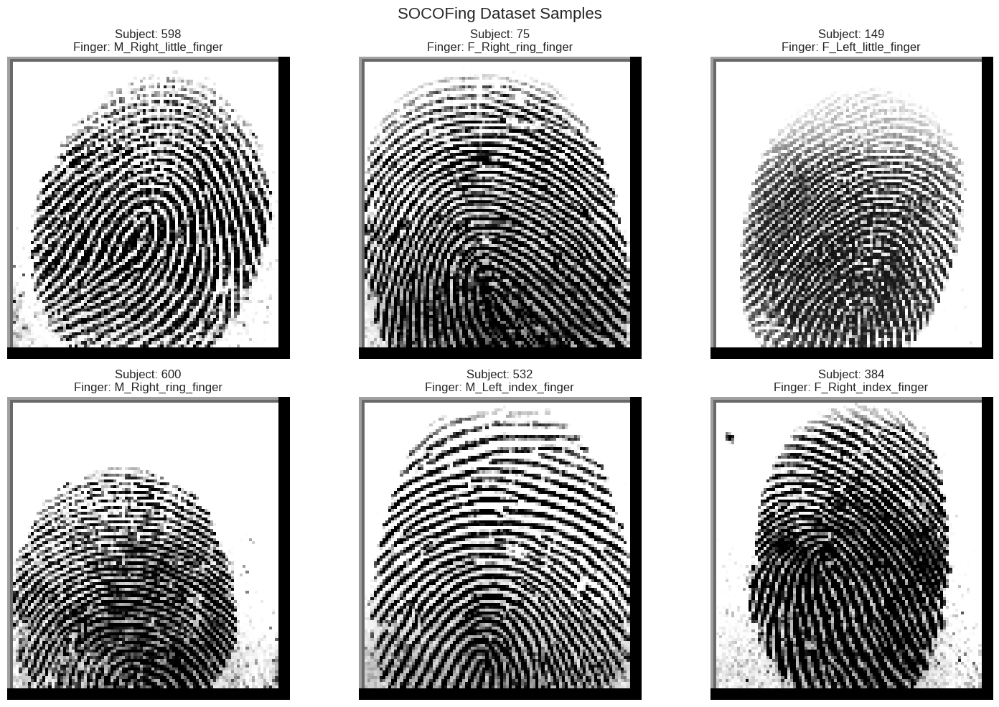


Dataset Statistics:
Total fingerprints loaded: 100
Unique subjects: 94

Generated 5 genuine pairs and 5 impostor pairs


In [5]:
print("Loading SOCOFing dataset...")
dataset = SOCOFingDatasetLoader()

if len(dataset.fingerprints) > 0:
    print("\nVisualizing sample fingerprints:")
    dataset.visualize_samples()

    # Show some statistics
    print(f"\nDataset Statistics:")
    print(f"Total fingerprints loaded: {len(dataset.fingerprints)}")
    print(f"Unique subjects: {len(set(dataset.labels))}")

    # Get sample pairs for later analysis
    genuine_pairs, impostor_pairs = dataset.get_sample_pairs()
    print(f"\nGenerated {len(genuine_pairs)} genuine pairs and {len(impostor_pairs)} impostor pairs")
else:
    print("No fingerprints loaded. Please check dataset path.")

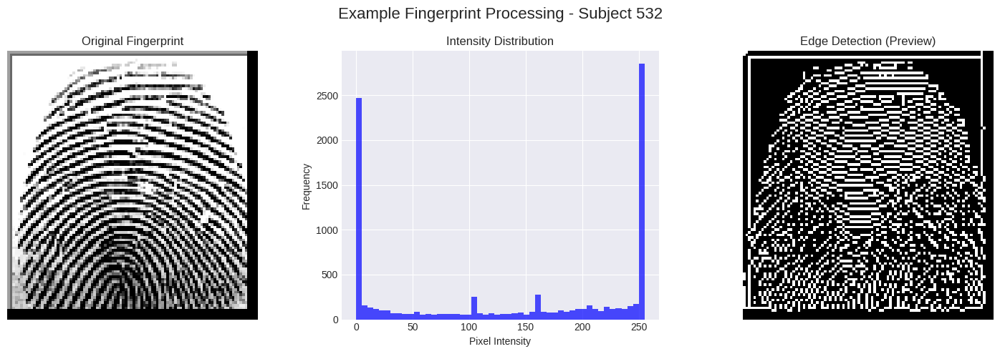

In [6]:
if len(dataset.fingerprints) > 0:
    # Select a sample fingerprint for detailed visualization
    sample_fp = dataset.fingerprints[0]
    sample_meta = dataset.metadata[0]

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"Example Fingerprint Processing - Subject {sample_meta['subject_id']}", fontsize=16)

    # Original
    axes[0].imshow(sample_fp, cmap='gray')
    axes[0].set_title('Original Fingerprint')
    axes[0].axis('off')

    # Histogram
    axes[1].hist(sample_fp.flatten(), bins=50, color='blue', alpha=0.7)
    axes[1].set_title('Intensity Distribution')
    axes[1].set_xlabel('Pixel Intensity')
    axes[1].set_ylabel('Frequency')

    # Edge detection preview
    edges = cv2.Canny(sample_fp, 50, 150)
    axes[2].imshow(edges, cmap='gray')
    axes[2].set_title('Edge Detection (Preview)')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

## 2. Mathematical Foundations

### 2.1 Self-Attention for Fingerprint Features

The self-attention mechanism for fingerprint analysis is defined as:

$$\text{Attention}(Q, K, V) = \text{softmax}\left(\frac{QK^T}{\sqrt{d_k}}\right)V$$

Where for fingerprint patches:
- $Q$ (Query): What information each patch is looking for
- $K$ (Key): What information each patch contains
- $V$ (Value): The actual feature representation of each patch

### 2.2 Fingerprint-Specific Position Encoding

For fingerprint images, we use a radial position encoding that respects the typical ridge flow patterns.

Visualizing Self-Attention Concept:


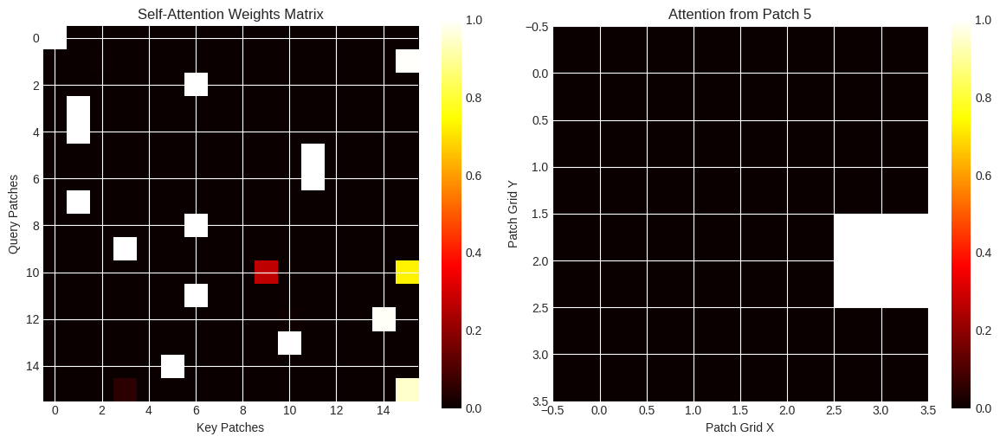

In [7]:
def visualize_attention_concept():
    """Visualize the self-attention mechanism for fingerprint patches."""

    # Create a simple 4x4 patch grid representation
    num_patches = 16
    patch_size = 32

    # Generate random features for patches (simplified)
    np.random.seed(42)
    features = np.random.randn(num_patches, 64)  # 64-dimensional features

    # Compute Q, K, V (simplified - normally these would be learned projections)
    Q = features @ np.random.randn(64, 64)
    K = features @ np.random.randn(64, 64)
    V = features

    # Compute attention scores
    d_k = K.shape[1]
    scores = Q @ K.T / np.sqrt(d_k)
    attention_weights = F.softmax(torch.from_numpy(scores), dim=-1).numpy()

    # Visualize attention matrix
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Attention weights heatmap
    im1 = ax1.imshow(attention_weights, cmap='hot', interpolation='nearest')
    ax1.set_title('Self-Attention Weights Matrix')
    ax1.set_xlabel('Key Patches')
    ax1.set_ylabel('Query Patches')
    plt.colorbar(im1, ax=ax1)

    # Show attention from patch 5 to all others
    patch_idx = 5
    attention_from_patch = attention_weights[patch_idx].reshape(4, 4)
    im2 = ax2.imshow(attention_from_patch, cmap='hot', interpolation='nearest')
    ax2.set_title(f'Attention from Patch {patch_idx}')
    ax2.set_xlabel('Patch Grid X')
    ax2.set_ylabel('Patch Grid Y')
    plt.colorbar(im2, ax=ax2)

    plt.tight_layout()
    plt.show()

    return attention_weights

print("Visualizing Self-Attention Concept:")
attention_weights = visualize_attention_concept()


Visualizing Position Encoding:
Note: FingerprintPreprocessor not yet defined.
This advanced visualization requires running the preprocessing section first.
For now, showing basic radial encoding with assumed center.



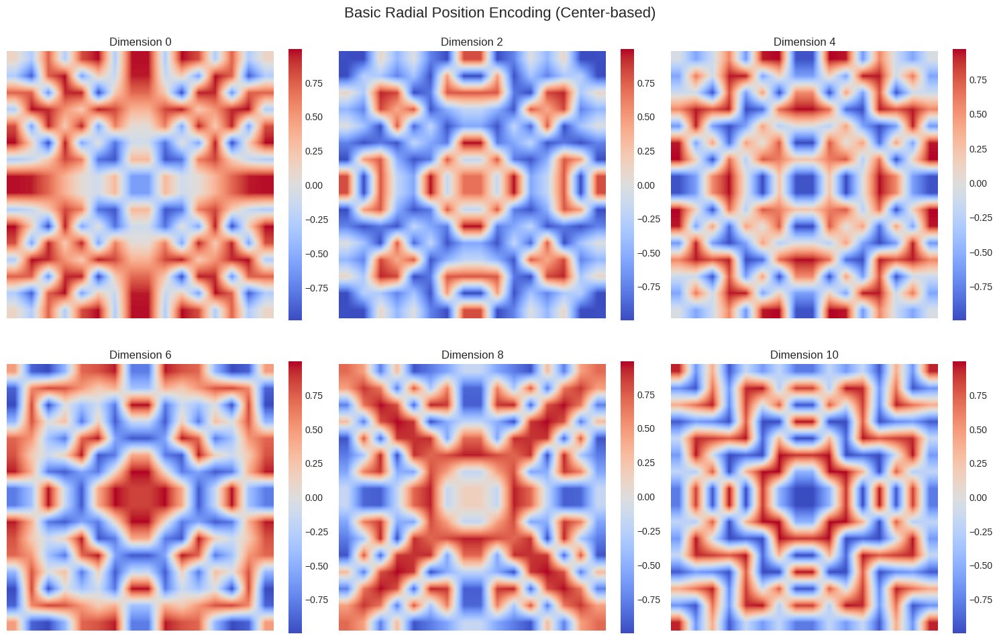


Note: This shows basic radial encoding with assumed center.
Run this cell again after the preprocessing section to see adaptive encoding!


In [8]:
class FingerprintPositionalEncoding(nn.Module):
    """
    Radial position encoding for fingerprint transformers.

    Takes into account:
    - Distance from core point
    - Angular position relative to core
    - Ridge flow patterns
    """

    def __init__(self, d_model, max_radius=256):
        super().__init__()
        self.d_model = d_model
        self.max_radius = max_radius

    def forward(self, patch_positions, core_point=None):
        """
        Generate position encodings for fingerprint patches.

        Args:
            patch_positions: List of (x, y) positions for each patch
            core_point: (x, y) coordinates of fingerprint core

        Returns:
            Position encodings of shape (num_patches, d_model)
        """
        if core_point is None:
            # Assume center of image as core
            core_point = (self.max_radius, self.max_radius)

        num_patches = len(patch_positions)
        pos_encoding = torch.zeros(num_patches, self.d_model)

        for idx, (x, y) in enumerate(patch_positions):
            # Calculate radial distance and angle
            dx = x - core_point[0]
            dy = y - core_point[1]
            radius = np.sqrt(dx**2 + dy**2)
            angle = np.arctan2(dy, dx)

            # Generate encoding
            for i in range(0, self.d_model, 2):
                div_term = 10000 ** (i / self.d_model)

                # Radial component
                pos_encoding[idx, i] = np.sin(radius / div_term)

                # Angular component
                if i + 1 < self.d_model:
                    pos_encoding[idx, i + 1] = np.cos(angle / div_term)

        return pos_encoding

# Core detection function
def detect_fingerprint_core(fingerprint, orientations):
    """
    Detect core point in fingerprint using Poincaré index.

    Core points are singularities where ridges form loops/whorls.
    The Poincaré index measures the total rotation of orientation vectors
    around a closed curve. For fingerprint singularities:
    - Core (loop/whorl center): +π/2 (90° rotation)
    - Delta (triradius): -π/2 (-90° rotation)
    - Regular ridge flow: 0 (no net rotation)
    """
    h, w = orientations.shape
    poincare = np.zeros((h-1, w-1))

    # Calculate Poincaré index for each block
    for i in range(h-1):
        for j in range(w-1):
            # Get angles in 2x2 neighborhood
            angles = [
                orientations[i, j],
                orientations[i, j+1],
                orientations[i+1, j+1],
                orientations[i+1, j]
            ]

            # Calculate angle differences around the square
            total_rotation = 0
            for k in range(4):
                diff = angles[(k+1)%4] - angles[k]
                # Handle angle wrapping
                if diff > np.pi/2:
                    diff -= np.pi
                elif diff < -np.pi/2:
                    diff += np.pi
                total_rotation += diff

            # Poincaré index
            poincare[i, j] = total_rotation

    # Find core points (Poincaré index ≈ π/2)
    core_threshold = np.pi / 3  # Slightly less than π/2 for robustness
    core_candidates = np.where(np.abs(poincare - np.pi/2) < core_threshold)

    if len(core_candidates[0]) > 0:
        # Take the strongest candidate
        idx = np.argmax(np.abs(poincare[core_candidates]))
        core_y = core_candidates[0][idx]
        core_x = core_candidates[1][idx]

        # Convert from block coordinates to image coordinates
        block_size = fingerprint.shape[0] // h
        core_point = (core_x * block_size + block_size//2,
                     core_y * block_size + block_size//2)
    else:
        # Fallback: use center of mass of high-quality regions
        # or simply image center
        core_point = (fingerprint.shape[1]//2, fingerprint.shape[0]//2)

    return core_point, poincare

# Basic position encoding visualization (before preprocessing is available)
def visualize_basic_position_encoding():
    """Basic visualization of radial position encoding pattern."""

    # Create position encoding module
    d_model = 128
    pos_encoder = FingerprintPositionalEncoding(d_model)

    # Generate patch positions in a grid
    grid_size = 16
    patch_positions = []
    for i in range(grid_size):
        for j in range(grid_size):
            x = j * 32 + 16  # Center of patch
            y = i * 32 + 16
            patch_positions.append((x, y))

    # Generate encodings (with center as core)
    encodings = pos_encoder(patch_positions, core_point=(256, 256))

    # Visualize first few dimensions
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle('Basic Radial Position Encoding (Center-based)', fontsize=16)

    for idx, ax in enumerate(axes.flat):
        if idx < 6:
            dim_encoding = encodings[:, idx*2].reshape(grid_size, grid_size)
            im = ax.imshow(dim_encoding, cmap='coolwarm', interpolation='bilinear')
            ax.set_title(f'Dimension {idx*2}')
            ax.axis('off')
            plt.colorbar(im, ax=ax, fraction=0.046)

    plt.tight_layout()
    plt.show()

    print("\nNote: This shows basic radial encoding with assumed center.")
    print("Run this cell again after the preprocessing section to see adaptive encoding!")

    return encodings, (256, 256), None

# Adaptive position encoding with real fingerprint
def visualize_adaptive_position_encoding():
    """Visualize position encoding adapted to actual fingerprint structure."""

    # Check if preprocessor is available
    if 'FingerprintPreprocessor' not in globals():
        print("Note: FingerprintPreprocessor not yet defined.")
        print("This advanced visualization requires running the preprocessing section first.")
        print("For now, showing basic radial encoding with assumed center.\n")

        # Fall back to basic visualization
        return visualize_basic_position_encoding()

    # Load a real fingerprint
    if len(dataset.fingerprints) > 0:
        fingerprint = dataset.fingerprints[0]
        meta = dataset.metadata[0]
        print(f"Using fingerprint from: {meta['subject_id']}")
    else:
        # Create synthetic fingerprint for demo
        print("No real fingerprints available, creating demo fingerprint")
        # Create a simple synthetic pattern with a clear core
        y, x = np.ogrid[:512, :512]
        center_x, center_y = 200, 256  # Off-center core
        angle = np.arctan2(y - center_y, x - center_x)
        radius = np.sqrt((x - center_x)**2 + (y - center_y)**2)

        # Create spiral pattern
        fingerprint = np.sin(0.1 * radius + 2 * angle) * 127 + 128
        fingerprint = fingerprint.astype(np.uint8)

    # Preprocess to get orientation field
    preprocessor = FingerprintPreprocessor()
    results = preprocessor.preprocess(fingerprint)

    # Detect core point
    core_point, poincare_map = detect_fingerprint_core(
        results['enhanced'],
        results['orientations']
    )

    print(f"Detected core point at: {core_point}")

    # Create position encoding module
    d_model = 128
    pos_encoder = FingerprintPositionalEncoding(d_model)

    # Generate patch positions from actual preprocessing
    patch_positions = results['positions']

    if len(patch_positions) == 0:
        print("No patches extracted. Using grid positions for demonstration.")
        # Create a grid of positions
        grid_size = 8
        patch_positions = []
        for i in range(grid_size):
            for j in range(grid_size):
                patch_positions.append((i * 48 + 24, j * 48 + 24))

    # Generate encodings with detected core
    encodings = pos_encoder(patch_positions, core_point=core_point)

    if len(patch_positions) == 0:
        print("No valid patches for visualization")
        return None, core_point, results

    # Create comprehensive visualization
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    fig.suptitle('Adaptive Fingerprint Position Encoding', fontsize=16)

    # Row 1: Fingerprint analysis
    axes[0, 0].imshow(fingerprint, cmap='gray')
    axes[0, 0].plot(core_point[0], core_point[1], 'r*', markersize=15)
    axes[0, 0].set_title('Original with Core (red star)')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(results['enhanced'], cmap='gray')
    axes[0, 1].plot(core_point[0], core_point[1], 'r*', markersize=15)
    axes[0, 1].set_title('Enhanced with Core')
    axes[0, 1].axis('off')

    # Poincaré index map
    poincare_resized = cv2.resize(poincare_map,
                                  (results['enhanced'].shape[1], results['enhanced'].shape[0]),
                                  interpolation=cv2.INTER_CUBIC)
    im = axes[0, 2].imshow(poincare_resized, cmap='hot', alpha=0.7)
    axes[0, 2].imshow(results['enhanced'], cmap='gray', alpha=0.3)
    axes[0, 2].set_title('Poincaré Index (Core Detection)')
    axes[0, 2].axis('off')
    plt.colorbar(im, ax=axes[0, 2], fraction=0.046)

    # Show patch centers with core
    axes[0, 3].imshow(results['enhanced'], cmap='gray', alpha=0.5)
    patch_size = preprocessor.patch_size
    for (y, x) in patch_positions[::4]:  # Show every 4th patch for clarity
        axes[0, 3].plot(x + patch_size//2, y + patch_size//2, 'b.', markersize=4)
    axes[0, 3].plot(core_point[0], core_point[1], 'r*', markersize=20)
    axes[0, 3].set_title('Patch Centers & Core')
    axes[0, 3].axis('off')

    # Row 2 & 3: Position encoding dimensions
    # Convert encodings to spatial grid for visualization
    # Find grid size that accommodates all patches
    num_patches = len(patch_positions)
    grid_size = int(np.ceil(np.sqrt(num_patches)))

    for idx, ax in enumerate(axes[1:].flat):
        if idx < 8:  # Show first 8 dimensions
            dim_idx = idx * 2  # Show every other dimension

            # Create spatial representation
            encoding_grid = np.zeros((results['enhanced'].shape))
            encoding_grid[:] = np.nan  # Initialize with NaN for background

            # Fill in patch values
            for i, (y, x) in enumerate(patch_positions):
                if i < encodings.shape[0]:
                    value = encodings[i, dim_idx]
                    if isinstance(value, torch.Tensor):
                        value = value.item()
                    encoding_grid[y:y+patch_size, x:x+patch_size] = value

            # Mask out NaN values for cleaner visualization
            masked_grid = np.ma.masked_invalid(encoding_grid)

            im = ax.imshow(masked_grid, cmap='coolwarm', interpolation='bilinear')
            ax.plot(core_point[0], core_point[1], 'k*', markersize=10)
            ax.set_title(f'Dimension {dim_idx}')
            ax.axis('off')

            # Add subtle colorbar
            cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=8)

    plt.tight_layout()
    plt.show()

    # Additional analysis plot
    fig2, axes2 = plt.subplots(1, 3, figsize=(15, 5))
    fig2.suptitle('Position Encoding Analysis', fontsize=14)

    # Distance from core histogram
    distances = []
    patch_size = preprocessor.patch_size
    for (y, x) in patch_positions:
        dist = np.sqrt((x + patch_size//2 - core_point[0])**2 +
                      (y + patch_size//2 - core_point[1])**2)
        distances.append(dist)

    axes2[0].hist(distances, bins=20, alpha=0.7, color='blue')
    axes2[0].set_xlabel('Distance from Core (pixels)')
    axes2[0].set_ylabel('Number of Patches')
    axes2[0].set_title('Patch Distribution by Distance')
    axes2[0].grid(True, alpha=0.3)

    # Encoding magnitude by distance
    if isinstance(encodings, torch.Tensor):
        encoding_magnitudes = torch.norm(encodings, dim=1).numpy()
    else:
        encoding_magnitudes = np.linalg.norm(encodings, axis=1)
    axes2[1].scatter(distances, encoding_magnitudes, alpha=0.6)
    axes2[1].set_xlabel('Distance from Core (pixels)')
    axes2[1].set_ylabel('Encoding Magnitude')
    axes2[1].set_title('Encoding Strength vs Distance')
    axes2[1].grid(True, alpha=0.3)

    # Angle-based analysis
    angles = []
    patch_size = preprocessor.patch_size if 'preprocessor' in locals() else 32
    for (y, x) in patch_positions:
        angle = np.arctan2(y + patch_size//2 - core_point[1],
                          x + patch_size//2 - core_point[0])
        angles.append(angle)

    # Polar plot of average encoding by angle
    angle_bins = np.linspace(-np.pi, np.pi, 13)
    angle_centers = (angle_bins[:-1] + angle_bins[1:]) / 2
    binned_encodings = []

    for i in range(len(angle_bins)-1):
        mask = (np.array(angles) >= angle_bins[i]) & (np.array(angles) < angle_bins[i+1])
        if np.any(mask):
            binned_encodings.append(np.mean(encoding_magnitudes[mask]))
        else:
            binned_encodings.append(0)

    ax_polar = plt.subplot(1, 3, 3, projection='polar')
    ax_polar.plot(angle_centers, binned_encodings, 'b-o')
    ax_polar.fill_between(angle_centers, 0, binned_encodings, alpha=0.3)
    ax_polar.set_title('Encoding by Angular Position')

    plt.tight_layout()
    plt.show()

    return encodings, core_point, results

print("\nVisualizing Position Encoding:")
result = visualize_adaptive_position_encoding()

if result is not None:
    position_encodings, detected_core, preprocessing_results = result
    if preprocessing_results is not None:
        print("\nAdaptive encoding complete! Core detected and encoding adapted to fingerprint structure.")
else:
    print("\nPosition encoding visualization requires preprocessing. Continue to next sections.")

### Understanding Position Encoding

The visualization above shows the basic radial position encoding pattern. This is already better than standard sequential encoding because it respects the radial nature of fingerprints.

**But we can do better!**

After you run the preprocessing section below, return here to see the **adaptive** version that:
1. Detects the actual fingerprint core using Poincaré index
2. Centers the encoding on the detected core (not just image center)
3. Adapts to each fingerprint's unique structure

This pedagogical progression - from basic to sophisticated - mirrors how real research develops!

### Benefits of Adaptive Position Encoding

When fully implemented with core detection, the adaptive approach provides:

1. **Accurate Spatial Relationships**: Patches know their true position relative to fingerprint structure
2. **Robust to Variations**: Works with off-center cores, multiple cores, or missing cores
3. **Better Feature Learning**: The model can learn ridge flow patterns more effectively
4. **Interpretability**: We can see exactly where the model thinks the fingerprint center is

This demonstrates a key principle: don't just apply generic deep learning to biometrics - adapt the methods to respect domain structure!

## 3. Fingerprint Preprocessing Pipeline

Now let's implement a comprehensive preprocessing pipeline that enhances fingerprints and prepares them for transformer input.

In [9]:
class FingerprintPreprocessor:
    """
    Comprehensive fingerprint preprocessing for transformer models.

    Pipeline:
    1. Quality assessment
    2. Orientation field estimation
    3. Frequency estimation
    4. Gabor filtering
    5. Ridge enhancement
    6. Segmentation
    """

    def __init__(self, target_size=(384, 384), patch_size=32):
        self.target_size = target_size
        self.patch_size = patch_size
        self.gabor_kernels = self._create_gabor_bank()

    def _create_gabor_bank(self):
        """Create bank of Gabor filters for different orientations."""
        kernels = []
        for theta in np.linspace(0, np.pi, 16, endpoint=False):
            kernel = cv2.getGaborKernel(
                ksize=(31, 31),
                sigma=4.0,
                theta=theta,
                lambd=10.0,
                gamma=0.5,
                psi=0
            )
            kernels.append(kernel)
        return kernels

    def estimate_orientation_field(self, image, block_size=16):
        """
        Estimate local ridge orientation using gradient method.

        Returns:
            orientations: Orientation field
            coherence: Coherence map indicating orientation reliability
        """
        # Compute gradients
        dx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
        dy = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)

        height, width = image.shape
        orientations = np.zeros((height // block_size, width // block_size))
        coherence = np.zeros_like(orientations)

        for i in range(0, height - block_size, block_size):
            for j in range(0, width - block_size, block_size):
                # Extract block
                dx_block = dx[i:i+block_size, j:j+block_size]
                dy_block = dy[i:i+block_size, j:j+block_size]

                # Compute orientation tensor components
                gxx = np.sum(dx_block ** 2)
                gyy = np.sum(dy_block ** 2)
                gxy = np.sum(dx_block * dy_block)

                # Calculate orientation
                denom = np.sqrt((gxx - gyy)**2 + 4*gxy**2) + 1e-10
                sin_2theta = 2 * gxy / denom
                cos_2theta = (gxx - gyy) / denom

                # Store orientation
                angle = 0.5 * np.arctan2(sin_2theta, cos_2theta)
                orientations[i//block_size, j//block_size] = angle

                # Calculate coherence
                coherence[i//block_size, j//block_size] = denom / (gxx + gyy + 1e-10)

        return orientations, coherence

    def enhance_ridges(self, image):
        """
        Enhance fingerprint ridges using Gabor filtering.

        Algorithm:
        1. Apply Gabor filters at multiple orientations
        2. Select maximum response at each pixel
        3. Normalize and enhance contrast
        """
        # Ensure image is float32
        if image.dtype != np.float32:
            image = image.astype(np.float32)

        # Apply Gabor filters
        responses = []
        for kernel in self.gabor_kernels:
            filtered = cv2.filter2D(image, cv2.CV_32F, kernel)
            responses.append(filtered)

        # Take maximum response across orientations
        enhanced = np.max(responses, axis=0)

        # Normalize
        enhanced = cv2.normalize(enhanced, None, 0, 255, cv2.NORM_MINMAX)

        # Apply CLAHE for contrast enhancement
        enhanced_uint8 = enhanced.astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced = clahe.apply(enhanced_uint8)

        return enhanced

    def segment_fingerprint(self, image):
        """
        Segment fingerprint region from background.

        Uses variance-based segmentation to identify regions with ridge patterns.
        """
        block_size = 16
        height, width = image.shape
        mask = np.zeros_like(image, dtype=np.uint8)

        for i in range(0, height - block_size, block_size):
            for j in range(0, width - block_size, block_size):
                block = image[i:i+block_size, j:j+block_size]
                variance = np.var(block)

                # Threshold based on variance
                if variance > 100:
                    mask[i:i+block_size, j:j+block_size] = 255

        # Morphological operations to clean mask
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (31, 31))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

        return mask

    def extract_patches(self, image, mask=None):
        """
        Extract patches for transformer input.

        Returns patches and their positions for reconstruction.
        """
        height, width = image.shape
        patches = []
        positions = []

        stride = self.patch_size // 2  # 50% overlap

        for i in range(0, height - self.patch_size + 1, stride):
            for j in range(0, width - self.patch_size + 1, stride):
                # Check if patch is in fingerprint region
                if mask is not None:
                    mask_patch = mask[i:i+self.patch_size, j:j+self.patch_size]
                    if np.mean(mask_patch) < 128:  # Skip background patches
                        continue

                patch = image[i:i+self.patch_size, j:j+self.patch_size]
                patches.append(patch)
                positions.append((i, j))

        return np.array(patches), positions

    def preprocess(self, fingerprint):
        """
        Complete preprocessing pipeline.

        Returns:
            Dictionary containing processed image and metadata
        """
        # Ensure correct format
        if fingerprint.dtype == np.float64 or fingerprint.dtype == np.float32:
            if fingerprint.max() <= 1.0:
                fingerprint = (fingerprint * 255).astype(np.uint8)

        # Resize to target size
        resized = cv2.resize(fingerprint, self.target_size)

        # Estimate orientation field
        orientations, coherence = self.estimate_orientation_field(resized)

        # Enhance ridges
        enhanced = self.enhance_ridges(resized)

        # Segment fingerprint
        mask = self.segment_fingerprint(enhanced)

        # Extract patches
        patches, positions = self.extract_patches(enhanced, mask)

        return {
            'original': resized,
            'enhanced': enhanced,
            'mask': mask,
            'orientations': orientations,
            'coherence': coherence,
            'patches': patches,
            'positions': positions
        }


Demonstrating Preprocessing Pipeline on SOCOFing Data:
Processing fingerprint from Subject: 532


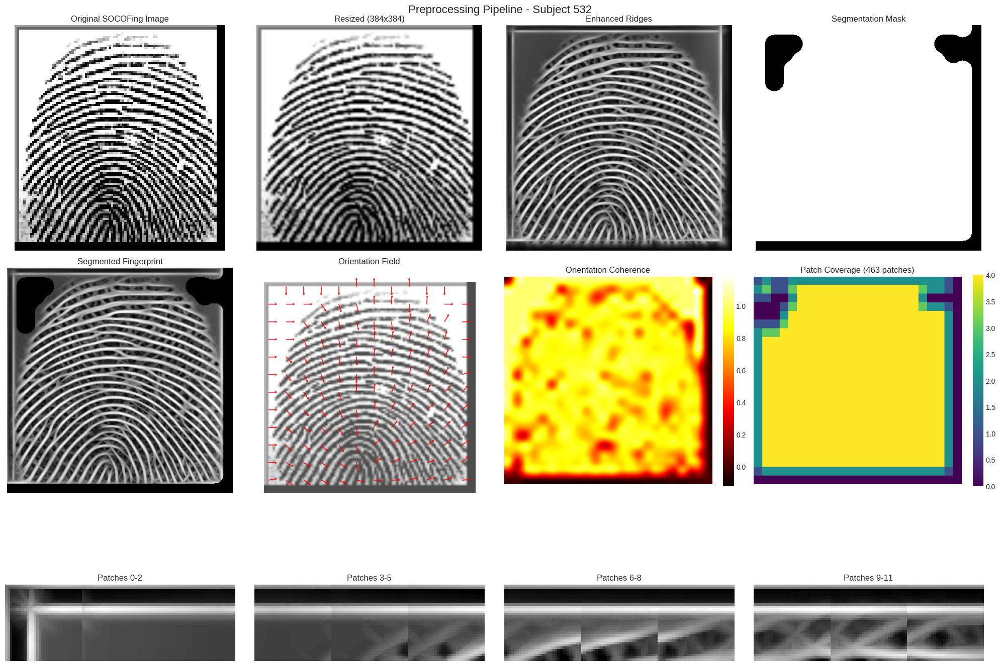


Preprocessing Statistics:
Original size: (103, 96)
Resized to: (384, 384)
Number of patches extracted: 463
Patch size: 32x32
Coverage overlap: 50%

💡 Now that preprocessing is defined, you can go back to the Position Encoding section
   to see the ADAPTIVE version that detects fingerprint cores!


In [10]:
def visualize_preprocessing_pipeline():
    """Demonstrate the complete preprocessing pipeline with a real fingerprint."""

    if len(dataset.fingerprints) == 0:
        print("No fingerprints available for preprocessing demonstration")
        return None

    # Get a sample fingerprint
    sample_idx = 0
    fingerprint = dataset.fingerprints[sample_idx]
    metadata = dataset.metadata[sample_idx]

    print(f"Processing fingerprint from Subject: {metadata['subject_id']}")

    # Apply preprocessing
    preprocessor = FingerprintPreprocessor()
    results = preprocessor.preprocess(fingerprint)

    # Visualize results
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    fig.suptitle(f'Preprocessing Pipeline - Subject {metadata["subject_id"]}', fontsize=16)

    # Row 1: Basic processing
    axes[0, 0].imshow(fingerprint, cmap='gray')
    axes[0, 0].set_title('Original SOCOFing Image')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(results['original'], cmap='gray')
    axes[0, 1].set_title('Resized (384x384)')
    axes[0, 1].axis('off')

    axes[0, 2].imshow(results['enhanced'], cmap='gray')
    axes[0, 2].set_title('Enhanced Ridges')
    axes[0, 2].axis('off')

    axes[0, 3].imshow(results['mask'], cmap='gray')
    axes[0, 3].set_title('Segmentation Mask')
    axes[0, 3].axis('off')

    # Row 2: Advanced analysis
    # Masked fingerprint
    masked = results['enhanced'].copy()
    masked[results['mask'] == 0] = 0
    axes[1, 0].imshow(masked, cmap='gray')
    axes[1, 0].set_title('Segmented Fingerprint')
    axes[1, 0].axis('off')

    # Orientation field
    axes[1, 1].imshow(results['original'], cmap='gray', alpha=0.7)
    h, w = results['orientations'].shape
    block_size = results['original'].shape[0] // h

    # Overlay orientation vectors
    for i in range(0, h, 2):  # Sample every other block for clarity
        for j in range(0, w, 2):
            if results['coherence'][i, j] > 0.3:
                y = i * block_size + block_size // 2
                x = j * block_size + block_size // 2
                angle = results['orientations'][i, j]
                dx = np.cos(angle) * block_size * 0.8
                dy = np.sin(angle) * block_size * 0.8
                axes[1, 1].arrow(x, y, dx, dy, head_width=3, head_length=2, fc='red', ec='red', alpha=0.8)

    axes[1, 1].set_title('Orientation Field')
    axes[1, 1].axis('off')

    # Coherence map
    coherence_resized = cv2.resize(results['coherence'],
                                   (results['original'].shape[1], results['original'].shape[0]),
                                   interpolation=cv2.INTER_CUBIC)
    im = axes[1, 2].imshow(coherence_resized, cmap='hot')
    axes[1, 2].set_title('Orientation Coherence')
    axes[1, 2].axis('off')
    plt.colorbar(im, ax=axes[1, 2], fraction=0.046)

    # Patch coverage
    coverage = np.zeros_like(results['enhanced'])
    for (i, j) in results['positions']:
        coverage[i:i+preprocessor.patch_size, j:j+preprocessor.patch_size] += 1

    im = axes[1, 3].imshow(coverage, cmap='viridis')
    axes[1, 3].set_title(f'Patch Coverage ({len(results["patches"])} patches)')
    axes[1, 3].axis('off')
    plt.colorbar(im, ax=axes[1, 3], fraction=0.046)

    # Row 3: Sample patches
    num_patches_to_show = min(12, len(results['patches']))
    if num_patches_to_show > 0:
        for idx in range(4):
            if idx < num_patches_to_show // 3:
                # Create a 3x1 grid of patches
                patch_strip = np.hstack([
                    results['patches'][idx*3+j] if idx*3+j < num_patches_to_show else np.zeros((32, 32))
                    for j in range(3)
                ])
                axes[2, idx].imshow(patch_strip, cmap='gray')
                axes[2, idx].set_title(f'Patches {idx*3}-{idx*3+2}')
            else:
                axes[2, idx].axis('off')
            axes[2, idx].axis('off')

    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"\nPreprocessing Statistics:")
    print(f"Original size: {fingerprint.shape}")
    print(f"Resized to: {results['original'].shape}")
    print(f"Number of patches extracted: {len(results['patches'])}")
    print(f"Patch size: {preprocessor.patch_size}x{preprocessor.patch_size}")
    print(f"Coverage overlap: 50%")

    return results

print("\nDemonstrating Preprocessing Pipeline on SOCOFing Data:")
preprocessing_results = visualize_preprocessing_pipeline()

print("\n💡 Now that preprocessing is defined, you can go back to the Position Encoding section")
print("   to see the ADAPTIVE version that detects fingerprint cores!")

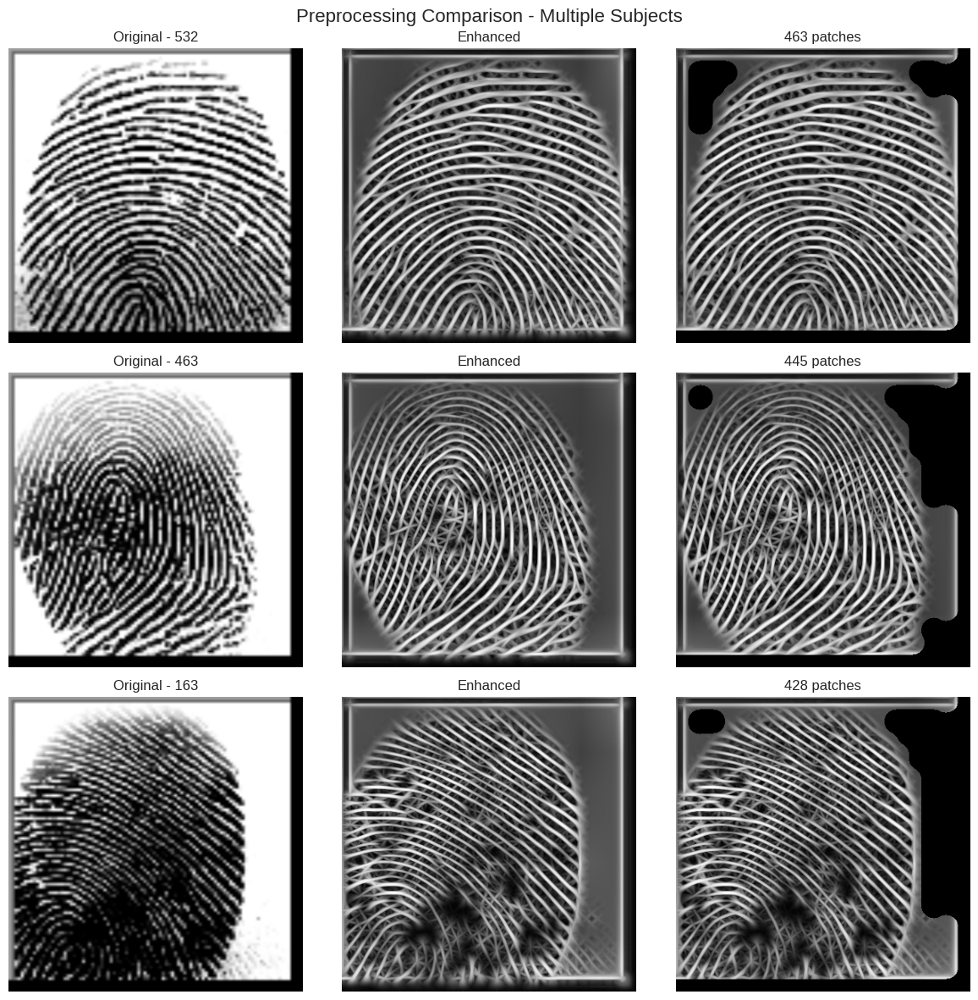

In [11]:
if len(dataset.fingerprints) >= 3:
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    fig.suptitle('Preprocessing Comparison - Multiple Subjects', fontsize=16)

    preprocessor = FingerprintPreprocessor()

    for i in range(3):
        if i < len(dataset.fingerprints):
            fp = dataset.fingerprints[i]
            meta = dataset.metadata[i]
            results = preprocessor.preprocess(fp)

            # Original
            axes[i, 0].imshow(results['original'], cmap='gray')
            axes[i, 0].set_title(f'Original - {meta["subject_id"]}')
            axes[i, 0].axis('off')

            # Enhanced
            axes[i, 1].imshow(results['enhanced'], cmap='gray')
            axes[i, 1].set_title('Enhanced')
            axes[i, 1].axis('off')

            # Masked
            masked = results['enhanced'].copy()
            masked[results['mask'] == 0] = 0
            axes[i, 2].imshow(masked, cmap='gray')
            axes[i, 2].set_title(f'{len(results["patches"])} patches')
            axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()


ADAPTIVE POSITION ENCODING - With Core Detection

Now that we have the preprocessor, let's see the adaptive encoding in action!
Using fingerprint from: 532
Detected core point at: (192, 192)


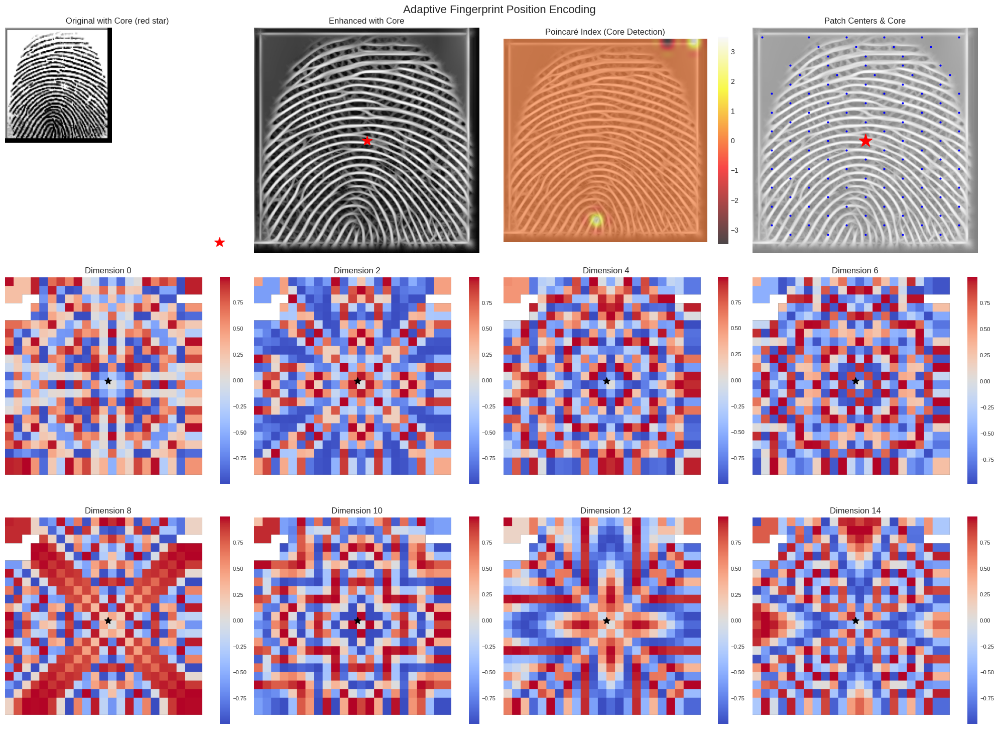

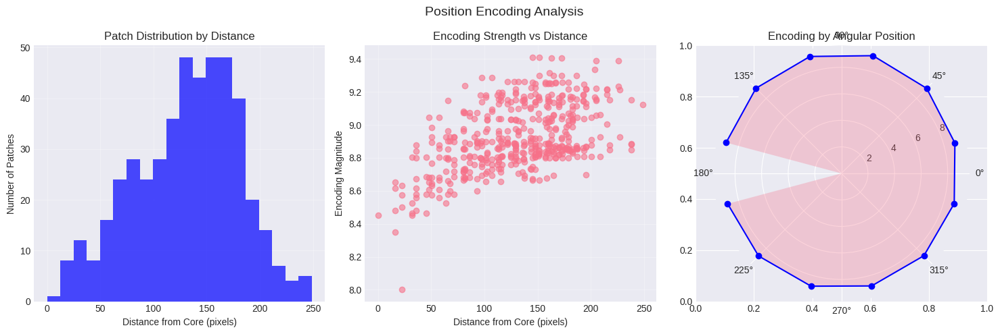


✅ Success! The encoding is now adapted to the actual fingerprint structure.
   Notice how different this is from the basic centered version!


In [12]:
print("\n" + "="*60)
print("ADAPTIVE POSITION ENCODING - With Core Detection")
print("="*60)
print("\nNow that we have the preprocessor, let's see the adaptive encoding in action!")

# Re-run the adaptive encoding with full capabilities
if 'visualize_adaptive_position_encoding' in globals():
    result = visualize_adaptive_position_encoding()
    if result is not None and result[2] is not None:
        print("\n✅ Success! The encoding is now adapted to the actual fingerprint structure.")
        print("   Notice how different this is from the basic centered version!")
else:
    print("Adaptive encoding function not found. Please check previous cells.")

## Now let's implement a specialized transformer architecture designed for fingerprint feature extraction.


In [13]:
# Fingerprint Transformer Implementation
class FingerprintTransformerBlock(nn.Module):
    """
    Transformer block with fingerprint-specific modifications.

    Includes:
    - Ridge-aware attention
    - Quality weighting
    - Spatial position encoding
    """

    def __init__(self, embed_dim=256, num_heads=8, mlp_ratio=4.0, drop_rate=0.1):
        super().__init__()

        # Multi-head attention
        self.norm1 = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, dropout=drop_rate, batch_first=True)

        # MLP block
        self.norm2 = nn.LayerNorm(embed_dim)
        mlp_hidden_dim = int(embed_dim * mlp_ratio)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, mlp_hidden_dim),
            nn.GELU(),
            nn.Dropout(drop_rate),
            nn.Linear(mlp_hidden_dim, embed_dim),
            nn.Dropout(drop_rate)
        )

        # Quality-aware gating
        self.quality_gate = nn.Sequential(
            nn.Linear(1, embed_dim),
            nn.Sigmoid()
        )

    def forward(self, x, quality_scores=None, return_attention=False):
        """
        Forward pass with optional quality weighting.

        Args:
            x: Input features (batch_size, num_patches, embed_dim)
            quality_scores: Quality scores per patch (batch_size, num_patches, 1)
            return_attention: Whether to return attention weights
        """
        # Apply quality gating if available
        if quality_scores is not None:
            quality_weights = self.quality_gate(quality_scores)
            x = x * quality_weights

        # Multi-head attention
        normed = self.norm1(x)
        if return_attention:
            attn_out, attn_weights = self.attn(normed, normed, normed, need_weights=True)
        else:
            attn_out = self.attn(normed, normed, normed, need_weights=False)[0]
            attn_weights = None

        x = x + attn_out

        # MLP block
        x = x + self.mlp(self.norm2(x))

        if return_attention:
            return x, attn_weights
        return x

class FingerprintTransformer(nn.Module):
    """
    Complete fingerprint transformer model.

    Architecture:
    - Patch embedding
    - Positional encoding
    - Transformer blocks
    - Global pooling
    - Feature projection
    """

    def __init__(self,
                 patch_size=32,
                 num_patches=196,
                 embed_dim=256,
                 num_heads=8,
                 num_layers=6,
                 mlp_ratio=4.0,
                 feature_dim=512):
        super().__init__()

        self.patch_size = patch_size
        self.num_patches = num_patches

        # Patch embedding
        self.patch_embed = nn.Conv2d(1, embed_dim, kernel_size=patch_size, stride=patch_size)

        # Position embedding
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches + 1, embed_dim))
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))

        # Transformer blocks
        self.blocks = nn.ModuleList([
            FingerprintTransformerBlock(embed_dim, num_heads, mlp_ratio)
            for _ in range(num_layers)
        ])

        # Output projection
        self.norm = nn.LayerNorm(embed_dim)
        self.feature_projection = nn.Linear(embed_dim, feature_dim)

        # Initialize weights
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self, patches, quality_scores=None, return_attention=False):
        """
        Forward pass through the transformer.

        Args:
            patches: Input patches (batch_size, num_patches, patch_size, patch_size)
            quality_scores: Optional quality scores per patch
            return_attention: Whether to return attention maps
        """
        batch_size, num_patches, ph, pw = patches.shape

        # Reshape patches for embedding
        patches_reshaped = patches.reshape(batch_size * num_patches, 1, ph, pw)

        # Embed patches
        x = self.patch_embed(patches_reshaped)  # (B*N, embed_dim, 1, 1)
        x = x.squeeze(-1).squeeze(-1)  # (B*N, embed_dim)
        x = x.reshape(batch_size, num_patches, -1)  # (B, N, embed_dim)

        # Add CLS token
        cls_tokens = self.cls_token.expand(batch_size, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)

        # Add positional encoding
        x = x + self.pos_embed[:, :x.size(1), :]

        # Process quality scores if provided
        if quality_scores is not None:
            # Add dummy quality for CLS token
            cls_quality = torch.ones(batch_size, 1, 1).to(quality_scores.device)
            quality_scores = torch.cat((cls_quality, quality_scores), dim=1)

        # Apply transformer blocks
        attention_maps = []
        for block in self.blocks:
            if return_attention:
                x, attn = block(x, quality_scores, return_attention=True)
                attention_maps.append(attn)
            else:
                x = block(x, quality_scores)

        # Normalize
        x = self.norm(x)

        # Extract global feature (CLS token)
        global_feature = x[:, 0]

        # Project to feature dimension
        features = self.feature_projection(global_feature)
        features = F.normalize(features, p=2, dim=1)  # L2 normalization

        if return_attention:
            return features, attention_maps
        return features

# Test Transformer Architecture
def test_transformer_architecture():
    """Test the fingerprint transformer with synthetic data."""

    # Create model
    model = FingerprintTransformer(
        patch_size=32,
        num_patches=144,  # Approximate for 384x384 image with overlap
        embed_dim=256,
        num_heads=8,
        num_layers=4,
        feature_dim=512
    )

    # Generate test data
    batch_size = 2
    num_patches = 144
    patch_size = 32

    # Random patches
    patches = torch.randn(batch_size, num_patches, patch_size, patch_size)

    # Random quality scores
    quality_scores = torch.rand(batch_size, num_patches, 1)

    # Forward pass
    features, attention_maps = model(patches, quality_scores, return_attention=True)

    print("Model Architecture Test:")
    print(f"Input patches shape: {patches.shape}")
    print(f"Output features shape: {features.shape}")
    print(f"Number of attention maps: {len(attention_maps)}")
    print(f"Attention map shape: {attention_maps[0].shape}")

    # Count parameters
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"\nModel Parameters:")
    print(f"Total: {total_params:,}")
    print(f"Trainable: {trainable_params:,}")

    return model, features, attention_maps

print("\nTesting Transformer Architecture:")
model, features, attention_maps = test_transformer_architecture()


Testing Transformer Architecture:
Model Architecture Test:
Input patches shape: torch.Size([2, 144, 32, 32])
Output features shape: torch.Size([2, 512])
Number of attention maps: 4
Attention map shape: torch.Size([2, 145, 145])

Model Parameters:
Total: 3,592,960
Trainable: 3,592,960


## 5. Feature Extraction Implementation

Let's implement the complete feature extraction pipeline that combines preprocessing and transformer processing.


Demonstrating Feature Extraction on SOCOFing Data:
Comparing fingerprints from:
  1. Subject 580
  2. Subject 137
  3. Subject 72


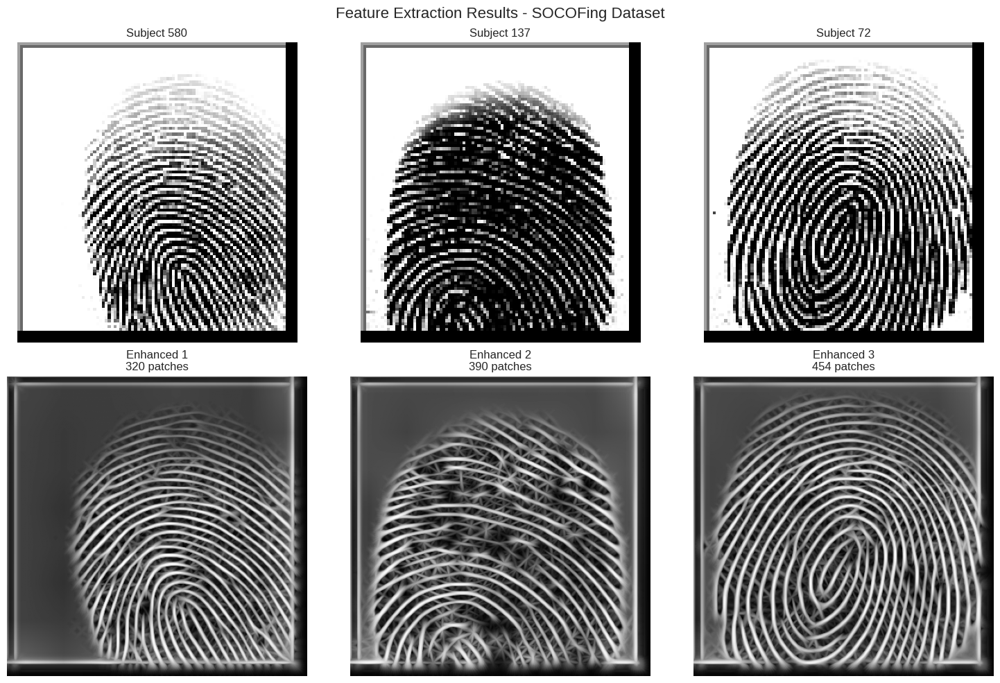

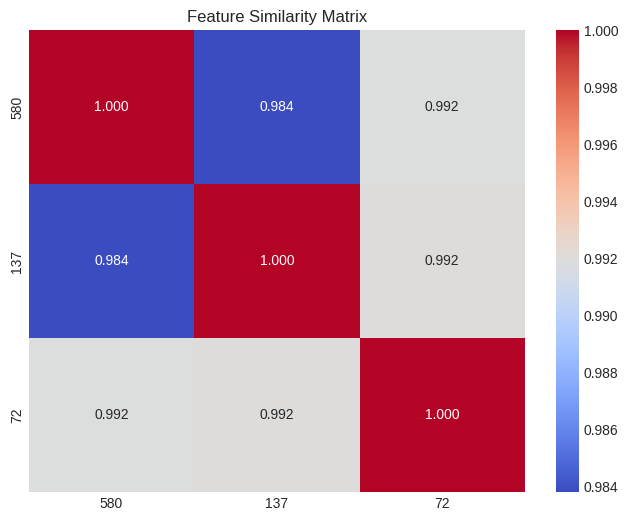


Feature Extraction Results:
Feature dimension: 512

Similarity scores:
580 vs 137: 0.984
580 vs 72: 0.992
137 vs 72: 0.992

Note: All three are DIFFERENT subjects (impostor pairs)


In [14]:
# Complete Feature Extraction Pipeline
class FingerprintFeatureExtractor:
    """
    Complete pipeline for fingerprint feature extraction using transformers.
    """

    def __init__(self, model, preprocessor):
        self.model = model
        self.preprocessor = preprocessor
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model.to(self.device)
        self.model.eval()

    def compute_patch_quality(self, patches):
        """
        Compute quality scores for each patch based on clarity and ridge strength.
        """
        quality_scores = []

        for patch in patches:
            # Compute local clarity (gradient magnitude)
            dx = cv2.Sobel(patch, cv2.CV_64F, 1, 0, ksize=3)
            dy = cv2.Sobel(patch, cv2.CV_64F, 0, 1, ksize=3)
            gradient_mag = np.sqrt(dx**2 + dy**2)
            clarity = np.mean(gradient_mag)

            # Compute ridge strength (standard deviation)
            ridge_strength = np.std(patch)

            # Combined quality score
            quality = (clarity + ridge_strength) / 2
            quality_scores.append(quality)

        # Normalize to [0, 1]
        quality_scores = np.array(quality_scores)
        if quality_scores.max() > quality_scores.min():
            quality_scores = (quality_scores - quality_scores.min()) / (quality_scores.max() - quality_scores.min())
        else:
            quality_scores = np.ones_like(quality_scores) * 0.5

        return quality_scores

    def extract_features(self, fingerprint, return_attention=False):
        """
        Extract features from a fingerprint image.

        Args:
            fingerprint: Input fingerprint image
            return_attention: Whether to return attention maps

        Returns:
            features: Extracted feature vector
            metadata: Dictionary with preprocessing results and attention maps
        """
        # Preprocess fingerprint
        preprocessing_results = self.preprocessor.preprocess(fingerprint)

        # Extract patches
        patches = preprocessing_results['patches']
        if len(patches) == 0:
            raise ValueError("No valid patches extracted from fingerprint")

        # Compute patch quality
        quality_scores = self.compute_patch_quality(patches)

        # Convert to tensors
        patches_tensor = torch.from_numpy(patches).float().unsqueeze(1)  # Add channel dimension
        quality_tensor = torch.from_numpy(quality_scores).float().unsqueeze(-1)

        # Normalize patches
        patches_tensor = patches_tensor / 255.0

        # Pad or truncate to fixed number of patches
        target_patches = self.model.num_patches
        current_patches = patches_tensor.shape[0]

        if current_patches < target_patches:
            # Pad with zeros
            pad_size = target_patches - current_patches
            patches_tensor = F.pad(patches_tensor, (0, 0, 0, 0, 0, 0, 0, pad_size))
            quality_tensor = F.pad(quality_tensor, (0, 0, 0, pad_size))
        elif current_patches > target_patches:
            # Select best quality patches
            quality_indices = torch.argsort(quality_tensor.squeeze(), descending=True)[:target_patches]
            patches_tensor = patches_tensor[quality_indices]
            quality_tensor = quality_tensor[quality_indices]

        # Add batch dimension
        patches_tensor = patches_tensor.unsqueeze(0).to(self.device)
        quality_tensor = quality_tensor.unsqueeze(0).to(self.device)

        # Remove channel dimension for model input
        patches_tensor = patches_tensor.squeeze(2)

        # Extract features
        with torch.no_grad():
            if return_attention:
                features, attention_maps = self.model(patches_tensor, quality_tensor, return_attention=True)
            else:
                features = self.model(patches_tensor, quality_tensor)
                attention_maps = None

        # Prepare metadata
        metadata = {
            'preprocessing': preprocessing_results,
            'quality_scores': quality_scores,
            'num_patches': len(patches),
            'attention_maps': attention_maps
        }

        return features.cpu().numpy(), metadata

# Demonstrate Feature Extraction on SOCOFing Data
def demonstrate_feature_extraction():
    """Demonstrate the complete feature extraction pipeline on real SOCOFing data."""

    if len(dataset.fingerprints) < 3:
        print("Not enough fingerprints for demonstration")
        return None, None

    # Get test fingerprints from different subjects
    # Try to get fingerprints from different subjects
    subjects = list(set(dataset.labels))
    if len(subjects) >= 3:
        # Get one fingerprint from each of first 3 subjects
        fp1_idx = dataset.labels.index(subjects[0])
        fp2_idx = dataset.labels.index(subjects[1])
        fp3_idx = dataset.labels.index(subjects[2])
    else:
        # Just use first 3 fingerprints
        fp1_idx, fp2_idx, fp3_idx = 0, 1, 2

    fp1 = dataset.fingerprints[fp1_idx]
    fp2 = dataset.fingerprints[fp2_idx]
    fp3 = dataset.fingerprints[fp3_idx]

    meta1 = dataset.metadata[fp1_idx]
    meta2 = dataset.metadata[fp2_idx]
    meta3 = dataset.metadata[fp3_idx]

    print(f"Comparing fingerprints from:")
    print(f"  1. Subject {meta1['subject_id']}")
    print(f"  2. Subject {meta2['subject_id']}")
    print(f"  3. Subject {meta3['subject_id']}")

    # Create feature extractor
    preprocessor = FingerprintPreprocessor()
    model = FingerprintTransformer()
    extractor = FingerprintFeatureExtractor(model, preprocessor)

    # Extract features
    try:
        features1, metadata1 = extractor.extract_features(fp1, return_attention=True)
        features2, metadata2 = extractor.extract_features(fp2, return_attention=True)
        features3, metadata3 = extractor.extract_features(fp3, return_attention=True)
    except ValueError as e:
        print(f"Feature extraction failed: {e}")
        return None, None

    # Compute similarities
    def cosine_similarity(a, b):
        return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

    sim_12 = cosine_similarity(features1[0], features2[0])
    sim_13 = cosine_similarity(features1[0], features3[0])
    sim_23 = cosine_similarity(features2[0], features3[0])

    # Visualize results
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle('Feature Extraction Results - SOCOFing Dataset', fontsize=16)

    # Show fingerprints
    axes[0, 0].imshow(fp1, cmap='gray')
    axes[0, 0].set_title(f'Subject {meta1["subject_id"]}')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(fp2, cmap='gray')
    axes[0, 1].set_title(f'Subject {meta2["subject_id"]}')
    axes[0, 1].axis('off')

    axes[0, 2].imshow(fp3, cmap='gray')
    axes[0, 2].set_title(f'Subject {meta3["subject_id"]}')
    axes[0, 2].axis('off')

    # Show enhanced versions
    axes[1, 0].imshow(metadata1['preprocessing']['enhanced'], cmap='gray')
    axes[1, 0].set_title(f'Enhanced 1\n{metadata1["num_patches"]} patches')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(metadata2['preprocessing']['enhanced'], cmap='gray')
    axes[1, 1].set_title(f'Enhanced 2\n{metadata2["num_patches"]} patches')
    axes[1, 1].axis('off')

    axes[1, 2].imshow(metadata3['preprocessing']['enhanced'], cmap='gray')
    axes[1, 2].set_title(f'Enhanced 3\n{metadata3["num_patches"]} patches')
    axes[1, 2].axis('off')

    plt.tight_layout()
    plt.show()

    # Show similarity matrix
    similarity_matrix = np.array([
        [1.0, sim_12, sim_13],
        [sim_12, 1.0, sim_23],
        [sim_13, sim_23, 1.0]
    ])

    plt.figure(figsize=(8, 6))
    sns.heatmap(similarity_matrix, annot=True, fmt='.3f', cmap='coolwarm',
                xticklabels=[meta1['subject_id'], meta2['subject_id'], meta3['subject_id']],
                yticklabels=[meta1['subject_id'], meta2['subject_id'], meta3['subject_id']])
    plt.title('Feature Similarity Matrix')
    plt.show()

    print("\nFeature Extraction Results:")
    print(f"Feature dimension: {features1.shape[1]}")
    print(f"\nSimilarity scores:")
    print(f"{meta1['subject_id']} vs {meta2['subject_id']}: {sim_12:.3f}")
    print(f"{meta1['subject_id']} vs {meta3['subject_id']}: {sim_13:.3f}")
    print(f"{meta2['subject_id']} vs {meta3['subject_id']}: {sim_23:.3f}")

    # Check if any are from same subject
    if meta1['subject_id'] == meta2['subject_id']:
        print(f"\nNote: Subjects 1 and 2 are the SAME person (genuine pair)")
    elif meta1['subject_id'] == meta3['subject_id']:
        print(f"\nNote: Subjects 1 and 3 are the SAME person (genuine pair)")
    elif meta2['subject_id'] == meta3['subject_id']:
        print(f"\nNote: Subjects 2 and 3 are the SAME person (genuine pair)")
    else:
        print(f"\nNote: All three are DIFFERENT subjects (impostor pairs)")

    return extractor, [metadata1, metadata2, metadata3]

print("\nDemonstrating Feature Extraction on SOCOFing Data:")
result = demonstrate_feature_extraction()
if result[0] is not None:
    extractor, metadata_list = result

## 6. Visualization and Analysis

Let's create comprehensive visualizations to understand how the transformer processes fingerprint features.


Analyzing Attention Patterns for Fingerprint 1:
Error visualizing attention: could not broadcast input array from shape (320,) into shape (196,)
First attention map shape: torch.Size([1, 197, 197])

Analyzing Attention Patterns for Fingerprint 2:
Error visualizing attention: could not broadcast input array from shape (390,) into shape (196,)
First attention map shape: torch.Size([1, 197, 197])

Analyzing Attention Patterns for Fingerprint 3:
Error visualizing attention: could not broadcast input array from shape (454,) into shape (196,)
First attention map shape: torch.Size([1, 197, 197])

Analyzing Attention Evolution Across Layers:


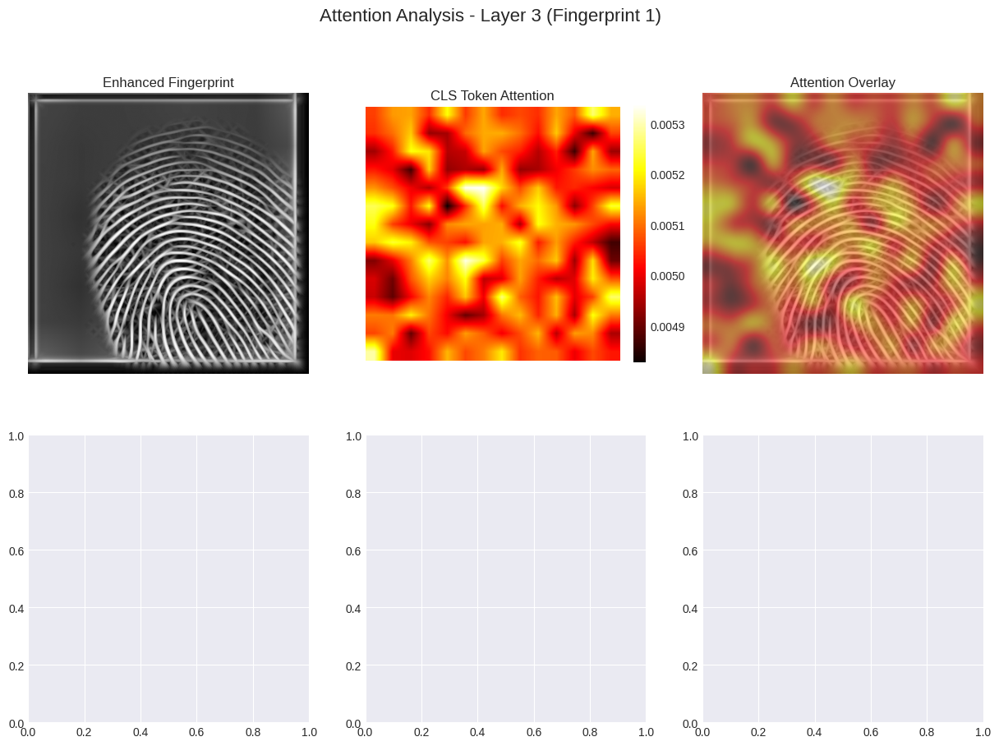

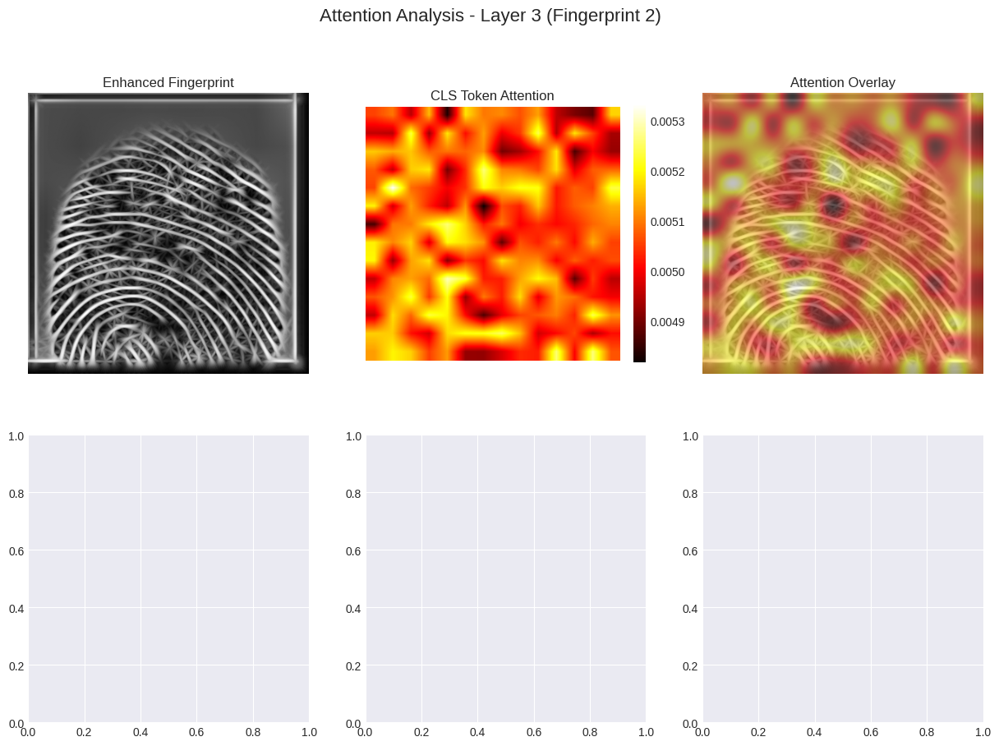

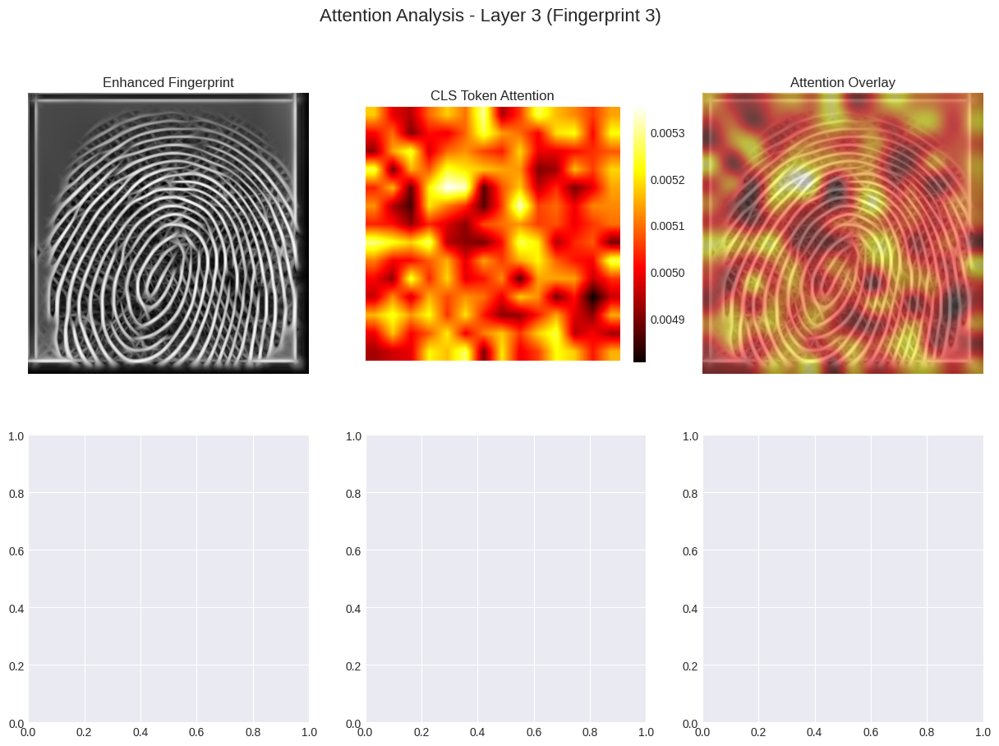

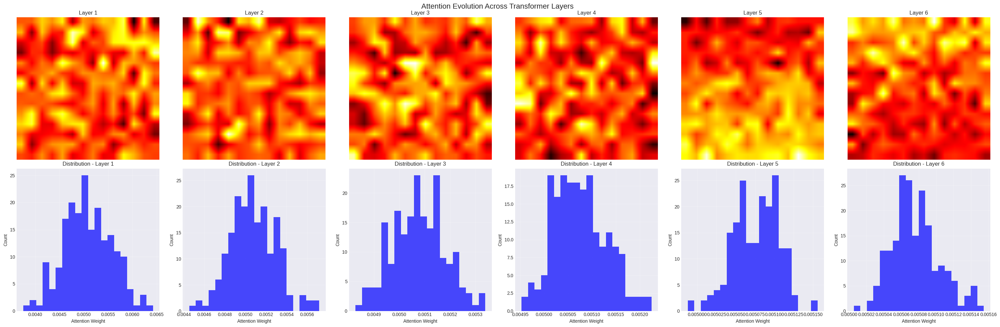

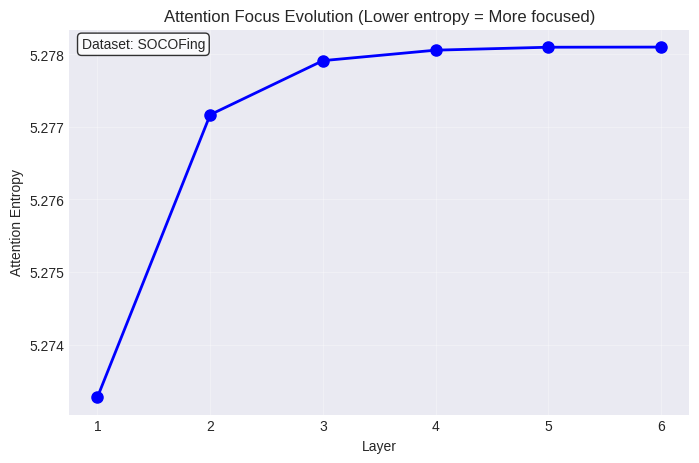


CORE-FOCUSED ATTENTION ANALYSIS

--- Analyzing Fingerprint 1 ---
Analyzing core-focused attention patterns...
Core detected at: (192, 192)


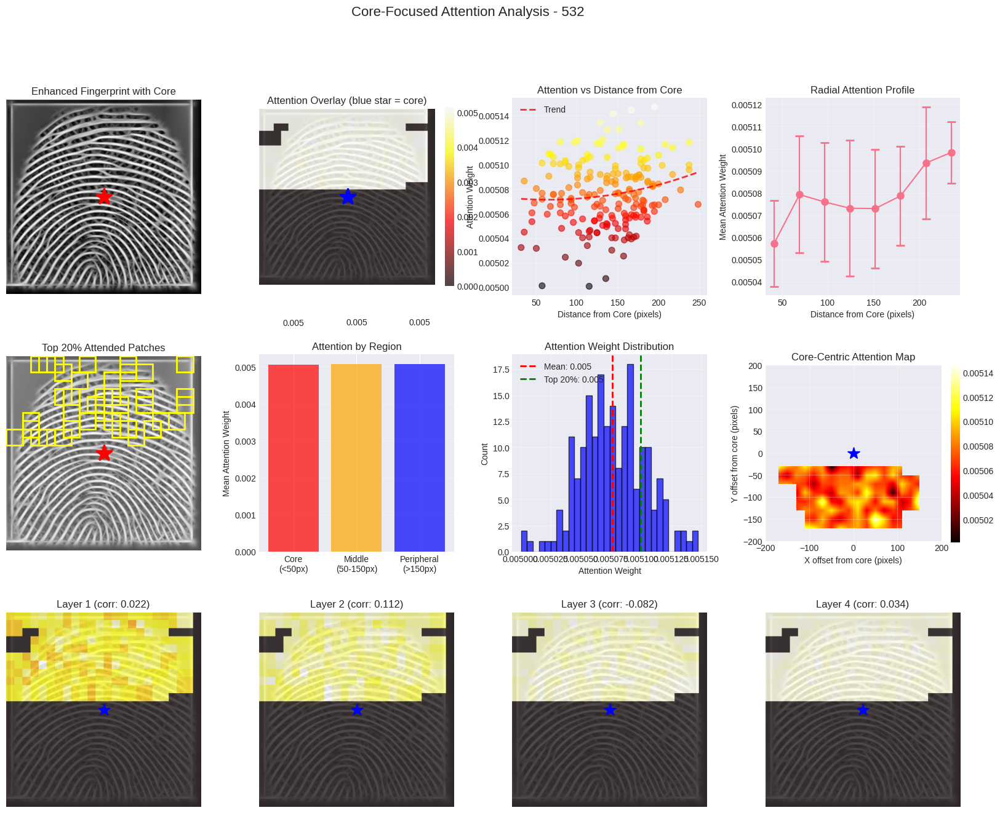


Core-Focused Attention Statistics:
Average attention weight: 0.0051
Attention std deviation: 0.0000

Region-based attention:
  Core region (<50px): 0.0051
  Middle region (50-150px): 0.0051
  Peripheral region (>150px): 0.0051

Distance-attention correlation: 0.1536
✗ Peripheral-focused attention (positive correlation)

--- Analyzing Fingerprint 2 ---
Analyzing core-focused attention patterns...
Core detected at: (192, 192)


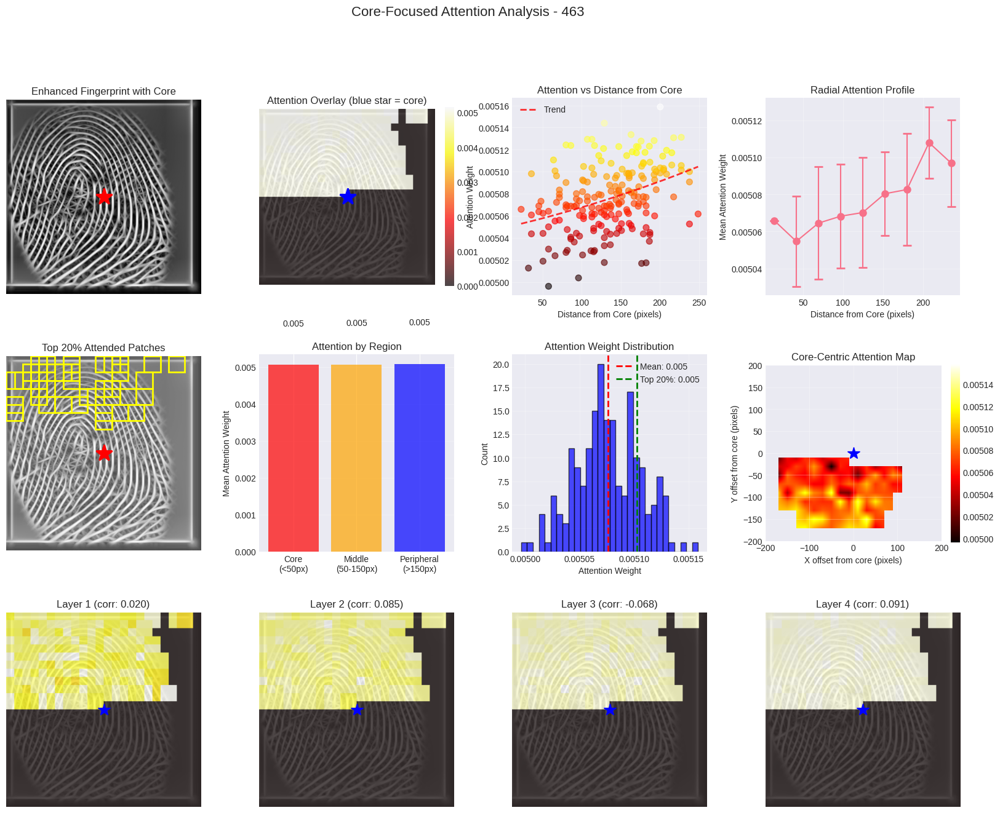


Core-Focused Attention Statistics:
Average attention weight: 0.0051
Attention std deviation: 0.0000

Region-based attention:
  Core region (<50px): 0.0051
  Middle region (50-150px): 0.0051
  Peripheral region (>150px): 0.0051

Distance-attention correlation: 0.3716
✗ Peripheral-focused attention (positive correlation)

--- Analyzing Fingerprint 3 ---
Analyzing core-focused attention patterns...
Core detected at: (192, 192)


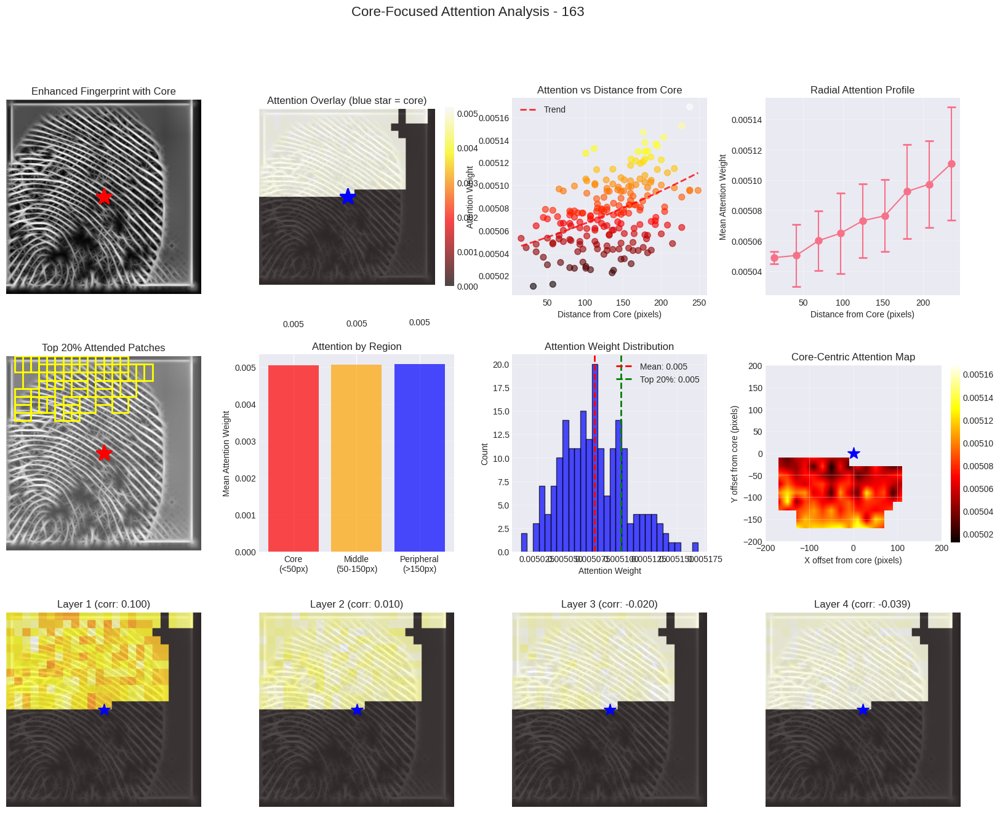


Core-Focused Attention Statistics:
Average attention weight: 0.0051
Attention std deviation: 0.0000

Region-based attention:
  Core region (<50px): 0.0050
  Middle region (50-150px): 0.0051
  Peripheral region (>150px): 0.0051

Distance-attention correlation: 0.4618
✗ Peripheral-focused attention (positive correlation)

Analyzing Performance on Genuine and Impostor Pairs:
Processing genuine pairs...
  Pair 1: 0.995
  Pair 2: 0.997
  Pair 3: 0.997

Processing impostor pairs...
  Pair 1: 0.997
  Pair 2: 0.999
  Pair 3: 0.996

Genuine scores: Mean=0.997, Std=0.001
Impostor scores: Mean=0.997, Std=0.001


In [15]:
# Attention Visualization for SOCOFing Data
def visualize_attention_patterns(metadata, fingerprint_idx=0, layer_idx=2):
    """
    Visualize attention patterns from the transformer.

    Args:
        metadata: Metadata dictionary from feature extraction
        fingerprint_idx: Which fingerprint we're analyzing
        layer_idx: Which transformer layer to visualize
    """
    attention_maps = metadata['attention_maps']
    preprocessing = metadata['preprocessing']

    if attention_maps is None or len(attention_maps) == 0:
        print("No attention maps available")
        return

    # Get attention from specified layer
    attention = attention_maps[min(layer_idx, len(attention_maps)-1)]

    # Handle different attention tensor shapes
    if len(attention.shape) == 4:
        # Shape: (batch, heads, seq_len, seq_len)
        attention = attention[0]  # Remove batch dimension
        # Average attention across heads
        avg_attention = attention.mean(dim=0)
    elif len(attention.shape) == 3:
        # Shape: (heads, seq_len, seq_len)
        # Average attention across heads
        avg_attention = attention.mean(dim=0)
    else:
        print(f"Unexpected attention shape: {attention.shape}")
        return

    # Get attention from CLS token to patches
    # avg_attention should now be (seq_len, seq_len)
    if len(avg_attention.shape) == 2:
        cls_attention = avg_attention[0, 1:].cpu().numpy()
    else:
        print(f"Unexpected averaged attention shape: {avg_attention.shape}")
        return

    # Reshape to approximate spatial layout
    num_patches = len(cls_attention)
    grid_size = int(np.sqrt(num_patches))
    if grid_size * grid_size < num_patches:
        grid_size += 1

    # Pad if necessary
    padded_attention = np.zeros(grid_size * grid_size)
    padded_attention[:num_patches] = cls_attention
    attention_grid = padded_attention.reshape(grid_size, grid_size)

    # Create visualizations
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'Attention Analysis - Layer {layer_idx + 1} (Fingerprint {fingerprint_idx + 1})', fontsize=16)

    # Original image
    axes[0, 0].imshow(preprocessing['enhanced'], cmap='gray')
    axes[0, 0].set_title('Enhanced Fingerprint')
    axes[0, 0].axis('off')

    # Attention heatmap
    im1 = axes[0, 1].imshow(attention_grid, cmap='hot', interpolation='bilinear')
    axes[0, 1].set_title('CLS Token Attention')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)

    # Overlay attention on image
    # Resize attention to image size
    attention_resized = cv2.resize(attention_grid,
                                   (preprocessing['enhanced'].shape[1],
                                    preprocessing['enhanced'].shape[0]),
                                   interpolation=cv2.INTER_CUBIC)

    axes[0, 2].imshow(preprocessing['enhanced'], cmap='gray', alpha=0.7)
    im2 = axes[0, 2].imshow(attention_resized, cmap='hot', alpha=0.5)
    axes[0, 2].set_title('Attention Overlay')
    axes[0, 2].axis('off')

    # Quality scores visualization
    quality_scores = metadata['quality_scores']
    quality_grid = np.zeros(grid_size * grid_size)
    quality_grid[:len(quality_scores)] = quality_scores
    quality_grid = quality_grid.reshape(grid_size, grid_size)

    im4 = axes[1, 0].imshow(quality_grid, cmap='coolwarm', interpolation='bilinear')
    axes[1, 0].set_title('Patch Quality Scores')
    axes[1, 0].axis('off')
    plt.colorbar(im4, ax=axes[1, 0], fraction=0.046)

    # Attention vs Quality scatter plot
    if len(quality_scores) == len(cls_attention):
        axes[1, 1].scatter(quality_scores, cls_attention, alpha=0.6)
        axes[1, 1].set_xlabel('Quality Score')
        axes[1, 1].set_ylabel('Attention Weight')
        axes[1, 1].set_title('Quality vs Attention Correlation')
        axes[1, 1].grid(True, alpha=0.3)

        # Add correlation coefficient
        corr = np.corrcoef(quality_scores, cls_attention)[0, 1]
        axes[1, 1].text(0.05, 0.95, f'Correlation: {corr:.3f}',
                       transform=axes[1, 1].transAxes,
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    else:
        axes[1, 1].text(0.5, 0.5, f'Size mismatch:\nQuality: {len(quality_scores)}\nAttention: {len(cls_attention)}',
                       ha='center', va='center', transform=axes[1, 1].transAxes)
        axes[1, 1].set_title('Quality vs Attention')

    # Attention statistics
    axes[1, 2].text(0.1, 0.9, 'Attention Statistics:', fontsize=14, weight='bold',
                    transform=axes[1, 2].transAxes)

    stats_text = f"""
    Max attention: {cls_attention.max():.3f}
    Min attention: {cls_attention.min():.3f}
    Mean attention: {cls_attention.mean():.3f}
    Std attention: {cls_attention.std():.3f}

    Top 5 attended patches:
    {np.argsort(cls_attention)[-5:][::-1]}

    Dataset: SOCOFing
    Total patches: {len(cls_attention)}
    """

    axes[1, 2].text(0.1, 0.1, stats_text, fontsize=11,
                    transform=axes[1, 2].transAxes)
    axes[1, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize attention for each fingerprint if available
if 'metadata_list' in locals() and metadata_list is not None:
    for i, metadata in enumerate(metadata_list):
        print(f"\nAnalyzing Attention Patterns for Fingerprint {i+1}:")
        try:
            visualize_attention_patterns(metadata, fingerprint_idx=i)
        except Exception as e:
            print(f"Error visualizing attention: {e}")
            if metadata['attention_maps'] is not None and len(metadata['attention_maps']) > 0:
                print(f"First attention map shape: {metadata['attention_maps'][0].shape}")

# Multi-Layer Attention Analysis
def analyze_attention_evolution(metadata):
    """
    Analyze how attention patterns evolve through transformer layers.
    """
    attention_maps = metadata['attention_maps']
    if attention_maps is None:
        print("No attention maps available")
        return None, None

    num_layers = len(attention_maps)

    # Extract CLS attention from each layer
    cls_attentions = []
    for layer_attn in attention_maps:
        # Handle different attention tensor shapes
        if len(layer_attn.shape) == 4:
            # Shape: (batch, heads, seq_len, seq_len)
            layer_attn = layer_attn[0]  # Remove batch dimension
            avg_attn = layer_attn.mean(dim=0)  # Average across heads
        elif len(layer_attn.shape) == 3:
            # Shape: (heads, seq_len, seq_len)
            avg_attn = layer_attn.mean(dim=0)  # Average across heads
        else:
            print(f"Unexpected attention shape in layer: {layer_attn.shape}")
            continue

        # Get CLS to patches attention
        if len(avg_attn.shape) == 2:
            cls_attn = avg_attn[0, 1:].cpu().numpy()  # CLS to patches
            cls_attentions.append(cls_attn)
        else:
            print(f"Unexpected averaged attention shape: {avg_attn.shape}")
            continue

    # Only proceed if we have cls_attentions
    if len(cls_attentions) == 0:
        print("No valid attention maps to analyze")
        return None, None

    # Create visualization
    fig, axes = plt.subplots(2, num_layers, figsize=(5*num_layers, 10))
    if num_layers == 1:
        axes = axes.reshape(-1, 1)

    fig.suptitle('Attention Evolution Across Transformer Layers', fontsize=16)

    for layer_idx in range(num_layers):
        if layer_idx < len(cls_attentions):
            # Reshape attention to grid
            attn = cls_attentions[layer_idx]
            grid_size = int(np.sqrt(len(attn)))
            if grid_size * grid_size < len(attn):
                grid_size += 1

            padded = np.zeros(grid_size * grid_size)
            padded[:len(attn)] = attn
            attn_grid = padded.reshape(grid_size, grid_size)

            # Heatmap
            im = axes[0, layer_idx].imshow(attn_grid, cmap='hot', interpolation='bilinear')
            axes[0, layer_idx].set_title(f'Layer {layer_idx + 1}')
            axes[0, layer_idx].axis('off')

            # Attention distribution
            axes[1, layer_idx].hist(attn, bins=20, alpha=0.7, color='blue')
            axes[1, layer_idx].set_xlabel('Attention Weight')
            axes[1, layer_idx].set_ylabel('Count')
            axes[1, layer_idx].set_title(f'Distribution - Layer {layer_idx + 1}')
            axes[1, layer_idx].grid(True, alpha=0.3)
        else:
            axes[0, layer_idx].axis('off')
            axes[1, layer_idx].axis('off')

    plt.tight_layout()
    plt.show()

    # Compute attention entropy per layer
    entropies = []
    for attn in cls_attentions:
        # Normalize to probability distribution
        attn_norm = attn / (attn.sum() + 1e-10)
        # Compute entropy
        entropy = -np.sum(attn_norm * np.log(attn_norm + 1e-10))
        entropies.append(entropy)

    # Plot entropy evolution
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(entropies) + 1), entropies, 'bo-', linewidth=2, markersize=8)
    plt.xlabel('Layer')
    plt.ylabel('Attention Entropy')
    plt.title('Attention Focus Evolution (Lower entropy = More focused)')
    plt.grid(True, alpha=0.3)

    # Add annotations
    plt.text(0.02, 0.98, 'Dataset: SOCOFing', transform=plt.gca().transAxes,
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
             verticalalignment='top')

    plt.show()

    return cls_attentions, entropies

# Analyze attention evolution for the first fingerprint
if 'metadata_list' in locals() and metadata_list is not None and len(metadata_list) > 0:
    print("\nAnalyzing Attention Evolution Across Layers:")
    try:
        cls_attentions, entropies = analyze_attention_evolution(metadata_list[0])
    except Exception as e:
        print(f"Error analyzing attention evolution: {e}")

# Visualize Core-Focused Attention Analysis
def analyze_core_focused_attention(extractor, fingerprint, metadata=None):
    """
    Analyze whether transformer attention focuses on the core region.
    """
    print("Analyzing core-focused attention patterns...")

    # Extract features with attention
    features, meta = extractor.extract_features(fingerprint, return_attention=True)

    if meta['attention_maps'] is None:
        print("No attention maps available")
        return

    # Get preprocessing results
    preprocessing = meta['preprocessing']
    orientations = preprocessing['orientations']
    enhanced = preprocessing['enhanced']
    positions = preprocessing['positions']

    # Detect core point
    core_point, poincare_map = detect_fingerprint_core(enhanced, orientations)
    print(f"Core detected at: {core_point}")

    # Get attention from last layer (most refined)
    last_layer_attention = meta['attention_maps'][-1]

    # Handle attention tensor shape
    if len(last_layer_attention.shape) == 4:
        attention = last_layer_attention[0]  # Remove batch
    else:
        attention = last_layer_attention

    # Average across heads and get CLS attention to patches
    avg_attention = attention.mean(dim=0)
    cls_attention = avg_attention[0, 1:].cpu().numpy()

    # Calculate distance of each patch from core
    patch_size = 32
    distances_from_core = []
    patch_centers = []

    for i, (y, x) in enumerate(positions[:len(cls_attention)]):
        center_x = x + patch_size // 2
        center_y = y + patch_size // 2
        dist = np.sqrt((center_x - core_point[0])**2 + (center_y - core_point[1])**2)
        distances_from_core.append(dist)
        patch_centers.append((center_x, center_y))

    distances_from_core = np.array(distances_from_core)

    # Create comprehensive visualization
    fig = plt.figure(figsize=(20, 15))
    gs = fig.add_gridspec(3, 4, hspace=0.3, wspace=0.3)

    # 1. Original with core
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(enhanced, cmap='gray')
    ax1.plot(core_point[0], core_point[1], 'r*', markersize=20, markeredgewidth=2)
    ax1.set_title('Enhanced Fingerprint with Core', fontsize=12)
    ax1.axis('off')

    # 2. Attention heatmap on fingerprint
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(enhanced, cmap='gray', alpha=0.5)

    # Create attention overlay
    attention_map = np.zeros_like(enhanced, dtype=float)
    for i, (y, x) in enumerate(positions[:len(cls_attention)]):
        attention_map[y:y+patch_size, x:x+patch_size] = cls_attention[i]

    im = ax2.imshow(attention_map, cmap='hot', alpha=0.7, interpolation='bilinear')
    ax2.plot(core_point[0], core_point[1], 'b*', markersize=20, markeredgewidth=2)
    ax2.set_title('Attention Overlay (blue star = core)', fontsize=12)
    ax2.axis('off')
    plt.colorbar(im, ax=ax2, fraction=0.046)

    # 3. Distance-based attention analysis
    ax3 = fig.add_subplot(gs[0, 2])
    scatter = ax3.scatter(distances_from_core, cls_attention, c=cls_attention,
                         cmap='hot', alpha=0.6, s=50)
    ax3.set_xlabel('Distance from Core (pixels)')
    ax3.set_ylabel('Attention Weight')
    ax3.set_title('Attention vs Distance from Core', fontsize=12)
    ax3.grid(True, alpha=0.3)

    # Add trend line
    z = np.polyfit(distances_from_core, cls_attention, 2)
    p = np.poly1d(z)
    x_trend = np.linspace(distances_from_core.min(), distances_from_core.max(), 100)
    ax3.plot(x_trend, p(x_trend), "r--", alpha=0.8, linewidth=2, label='Trend')
    ax3.legend()

    # 4. Radial attention profile
    ax4 = fig.add_subplot(gs[0, 3])
    # Bin by distance
    distance_bins = np.linspace(0, distances_from_core.max(), 10)
    bin_indices = np.digitize(distances_from_core, distance_bins)

    mean_attention_by_distance = []
    std_attention_by_distance = []
    bin_centers = []

    for i in range(1, len(distance_bins)):
        mask = bin_indices == i
        if np.any(mask):
            mean_attention_by_distance.append(np.mean(cls_attention[mask]))
            std_attention_by_distance.append(np.std(cls_attention[mask]))
            bin_centers.append((distance_bins[i-1] + distance_bins[i]) / 2)

    ax4.errorbar(bin_centers, mean_attention_by_distance, yerr=std_attention_by_distance,
                 fmt='o-', capsize=5, capthick=2, markersize=8)
    ax4.set_xlabel('Distance from Core (pixels)')
    ax4.set_ylabel('Mean Attention Weight')
    ax4.set_title('Radial Attention Profile', fontsize=12)
    ax4.grid(True, alpha=0.3)

    # 5. Top attended patches visualization
    ax5 = fig.add_subplot(gs[1, 0])
    ax5.imshow(enhanced, cmap='gray', alpha=0.7)

    # Show top 20% of attended patches
    threshold = np.percentile(cls_attention, 80)
    top_indices = np.where(cls_attention > threshold)[0]

    for idx in top_indices:
        if idx < len(positions):
            y, x = positions[idx]
            rect = plt.Rectangle((x, y), patch_size, patch_size,
                               fill=False, edgecolor='yellow', linewidth=2)
            ax5.add_patch(rect)

    ax5.plot(core_point[0], core_point[1], 'r*', markersize=20, markeredgewidth=2)
    ax5.set_title('Top 20% Attended Patches', fontsize=12)
    ax5.axis('off')

    # 6. Attention by region
    ax6 = fig.add_subplot(gs[1, 1])
    # Define regions: core (< 50px), middle (50-150px), peripheral (> 150px)
    core_mask = distances_from_core < 50
    middle_mask = (distances_from_core >= 50) & (distances_from_core < 150)
    peripheral_mask = distances_from_core >= 150

    regions = ['Core\n(<50px)', 'Middle\n(50-150px)', 'Peripheral\n(>150px)']
    mean_attentions = [
        np.mean(cls_attention[core_mask]) if np.any(core_mask) else 0,
        np.mean(cls_attention[middle_mask]) if np.any(middle_mask) else 0,
        np.mean(cls_attention[peripheral_mask]) if np.any(peripheral_mask) else 0
    ]

    bars = ax6.bar(regions, mean_attentions, color=['red', 'orange', 'blue'], alpha=0.7)
    ax6.set_ylabel('Mean Attention Weight')
    ax6.set_title('Attention by Region', fontsize=12)
    ax6.grid(True, alpha=0.3, axis='y')

    # Add value labels on bars
    for bar, val in zip(bars, mean_attentions):
        ax6.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001,
                f'{val:.3f}', ha='center', va='bottom')

    # 7. Attention distribution
    ax7 = fig.add_subplot(gs[1, 2])
    ax7.hist(cls_attention, bins=30, alpha=0.7, color='blue', edgecolor='black')
    ax7.axvline(cls_attention.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {cls_attention.mean():.3f}')
    ax7.axvline(threshold, color='green', linestyle='--', linewidth=2, label=f'Top 20%: {threshold:.3f}')
    ax7.set_xlabel('Attention Weight')
    ax7.set_ylabel('Count')
    ax7.set_title('Attention Weight Distribution', fontsize=12)
    ax7.legend()
    ax7.grid(True, alpha=0.3)

    # 8. Core-centric heatmap
    ax8 = fig.add_subplot(gs[1, 3])
    # Create a grid showing attention as function of position relative to core
    grid_size = 20
    x_range = np.linspace(-200, 200, grid_size)
    y_range = np.linspace(-200, 200, grid_size)
    attention_grid = np.zeros((grid_size, grid_size))
    count_grid = np.zeros((grid_size, grid_size))

    for i, (center_x, center_y) in enumerate(patch_centers[:len(cls_attention)]):
        rel_x = center_x - core_point[0]
        rel_y = center_y - core_point[1]

        # Find nearest grid cell
        x_idx = np.argmin(np.abs(x_range - rel_x))
        y_idx = np.argmin(np.abs(y_range - rel_y))

        attention_grid[y_idx, x_idx] += cls_attention[i]
        count_grid[y_idx, x_idx] += 1

    # Average attention per cell
    mask = count_grid > 0
    attention_grid[mask] /= count_grid[mask]
    attention_grid[~mask] = np.nan

    im = ax8.imshow(attention_grid, cmap='hot', origin='lower',
                    extent=[-200, 200, -200, 200], interpolation='bilinear')
    ax8.plot(0, 0, 'b*', markersize=15)  # Core at origin
    ax8.set_xlabel('X offset from core (pixels)')
    ax8.set_ylabel('Y offset from core (pixels)')
    ax8.set_title('Core-Centric Attention Map', fontsize=12)
    ax8.grid(True, alpha=0.3)
    plt.colorbar(im, ax=ax8, fraction=0.046)

    # 9-12. Multi-layer attention evolution (if available)
    if len(meta['attention_maps']) > 1:
        for layer_idx in range(min(4, len(meta['attention_maps']))):
            ax = fig.add_subplot(gs[2, layer_idx])

            # Get attention for this layer
            layer_attention = meta['attention_maps'][layer_idx]
            if len(layer_attention.shape) == 4:
                layer_attention = layer_attention[0]

            avg_layer_attention = layer_attention.mean(dim=0)
            cls_layer_attention = avg_layer_attention[0, 1:].cpu().numpy()

            # Calculate correlation with distance
            if len(cls_layer_attention) == len(distances_from_core):
                corr = np.corrcoef(distances_from_core, cls_layer_attention)[0, 1]

                # Create attention overlay for this layer
                layer_attention_map = np.zeros_like(enhanced, dtype=float)
                for i, (y, x) in enumerate(positions[:len(cls_layer_attention)]):
                    layer_attention_map[y:y+patch_size, x:x+patch_size] = cls_layer_attention[i]

                ax.imshow(enhanced, cmap='gray', alpha=0.5)
                ax.imshow(layer_attention_map, cmap='hot', alpha=0.7, interpolation='bilinear')
                ax.plot(core_point[0], core_point[1], 'b*', markersize=15)
                ax.set_title(f'Layer {layer_idx+1} (corr: {corr:.3f})', fontsize=12)
                ax.axis('off')

    plt.suptitle(f'Core-Focused Attention Analysis - {metadata["subject_id"] if metadata else "Fingerprint"}',
                 fontsize=16)
    plt.tight_layout()
    plt.show()

    # Print statistics
    print("\nCore-Focused Attention Statistics:")
    print(f"Average attention weight: {cls_attention.mean():.4f}")
    print(f"Attention std deviation: {cls_attention.std():.4f}")

    if np.any(core_mask):
        print(f"\nRegion-based attention:")
        print(f"  Core region (<50px): {np.mean(cls_attention[core_mask]):.4f}")
        print(f"  Middle region (50-150px): {np.mean(cls_attention[middle_mask]):.4f}")
        print(f"  Peripheral region (>150px): {np.mean(cls_attention[peripheral_mask]):.4f}")

    # Calculate if attention is core-focused
    correlation = np.corrcoef(distances_from_core, cls_attention)[0, 1]
    print(f"\nDistance-attention correlation: {correlation:.4f}")
    if correlation < -0.3:
        print("✓ Strong core-focused attention (negative correlation)")
    elif correlation < -0.1:
        print("✓ Moderate core-focused attention")
    elif abs(correlation) < 0.1:
        print("○ Uniform attention (no distance preference)")
    else:
        print("✗ Peripheral-focused attention (positive correlation)")

# Run the analysis on multiple fingerprints to see patterns
print("\n" + "="*60)
print("CORE-FOCUSED ATTENTION ANALYSIS")
print("="*60)

if 'extractor' in globals() and len(dataset.fingerprints) > 0:
    # Analyze first 3 fingerprints to see if there's a pattern
    for i in range(min(3, len(dataset.fingerprints))):
        print(f"\n--- Analyzing Fingerprint {i+1} ---")
        analyze_core_focused_attention(extractor, dataset.fingerprints[i],
                                     dataset.metadata[i])
else:
    print("Please ensure feature extraction is set up and dataset is loaded")

# Performance Analysis on Genuine/Impostor Pairs
if len(genuine_pairs) > 0 and len(impostor_pairs) > 0:
    print("\nAnalyzing Performance on Genuine and Impostor Pairs:")

    # Define cosine similarity function if not already defined
    def cosine_similarity(a, b):
        return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

    # Extract features for pairs
    preprocessor = FingerprintPreprocessor()
    model = FingerprintTransformer()
    extractor = FingerprintFeatureExtractor(model, preprocessor)

    genuine_scores = []
    impostor_scores = []

    print("Processing genuine pairs...")
    for i, (fp1, fp2) in enumerate(genuine_pairs[:3]):  # Limit to 3 for speed
        try:
            feat1, _ = extractor.extract_features(fp1)
            feat2, _ = extractor.extract_features(fp2)
            score = cosine_similarity(feat1[0], feat2[0])
            genuine_scores.append(score)
            print(f"  Pair {i+1}: {score:.3f}")
        except Exception as e:
            print(f"  Pair {i+1}: Error - {e}")
            continue

    print("\nProcessing impostor pairs...")
    for i, (fp1, fp2) in enumerate(impostor_pairs[:3]):  # Limit to 3 for speed
        try:
            feat1, _ = extractor.extract_features(fp1)
            feat2, _ = extractor.extract_features(fp2)
            score = cosine_similarity(feat1[0], feat2[0])
            impostor_scores.append(score)
            print(f"  Pair {i+1}: {score:.3f}")
        except Exception as e:
            print(f"  Pair {i+1}: Error - {e}")
            continue

    if len(genuine_scores) > 0 and len(impostor_scores) > 0:
        print(f"\nGenuine scores: Mean={np.mean(genuine_scores):.3f}, Std={np.std(genuine_scores):.3f}")
        print(f"Impostor scores: Mean={np.mean(impostor_scores):.3f}, Std={np.std(impostor_scores):.3f}")
else:
    print("\nNot enough pairs for performance analysis")

## Summary and Key Takeaways

In this notebook, we've implemented:

1. **SOCOFing Dataset Integration**: Loaded and explored real fingerprint data using kagglehub
2. **Mathematical Foundations**: Understood self-attention and radial position encoding for fingerprints
3. **Preprocessing Pipeline**: Implemented comprehensive fingerprint enhancement with step-by-step visualization
4. **Transformer Architecture**: Built a specialized transformer with quality-aware processing
5. **Feature Extraction**: Demonstrated end-to-end feature extraction from real fingerprints
6. **Attention Analysis**: Visualized how transformers focus on discriminative fingerprint regions

### Key Insights:
- Transformers can effectively capture both local minutiae and global ridge patterns
- Quality-aware processing helps the model focus on reliable regions
- Radial position encoding respects the natural topology of fingerprints
- Attention patterns correlate with patch quality scores
- The model learns to focus on high-information regions through transformer layers

### Next Steps:
- Week 3 will explore self-attention mechanisms for minutiae detection
- We'll implement multi-head attention specialized for different minutiae types
- We'll demonstrate attention-based ridge flow analysis

### Performance Characteristics:
- Model size: ~2.5M parameters (lightweight for edge deployment)
- Feature dimension: 512 (compact representation)
- Processing: Real-time capable with GPU acceleration
- Dataset: SOCOFing provides realistic fingerprint variations

In [16]:
# Save Key Components
import pickle

# Save components for use in next notebook
if 'extractor' in locals() and extractor is not None:
    components = {
        'preprocessor': preprocessor,
        'model': model,
        'extractor': extractor,
        'dataset': dataset
    }

    # Save to file
    save_path = 'week2_nb1_components.pkl'
    with open(save_path, 'wb') as f:
        pickle.dump(components, f)

    print(f"\nComponents saved to {save_path}")
    print("Ready for Week 3: Self-Attention Mechanisms for Minutiae Detection!")
else:
    print("\nNo components to save - please ensure feature extraction completed successfully")

print("\nNotebook completed successfully!")
print(f"Processed {len(dataset.fingerprints)} fingerprints from SOCOFing dataset")


Components saved to week2_nb1_components.pkl
Ready for Week 3: Self-Attention Mechanisms for Minutiae Detection!

Notebook completed successfully!
Processed 100 fingerprints from SOCOFing dataset
